## Import modules
If you run this notebook on high performance computing (HPC) clusters, you may
- run jupyter on a compute node via VSCode (https://docs.ncsa.illinois.edu/systems/delta/en/latest/user_guide/vscode/remote_jupyter.html)
- check whether the jupyter kernel is running in a compute node using
```bash
!hostnamectl
```
- change your directory 
```bash
%cd <your-directory>/SiC_MLMD_phase_diagram
```

In [ ]:
import numpy as np
import os, glob
import matplotlib.pyplot as plt
#%matplotlib inline,
import matplotlib as mpl
import matplotlib.pylab as pl
import matplotlib.gridspec as gridspec
from matplotlib.markers import MarkerStyle
mpl.rcParams['figure.dpi'] = 200
plt.style.use('tableau-colorblind10')
#plt.rcParams['text.usetex'] = True,
plt.rcParams.update({
    'font.size': 13,
    'legend.fontsize': 13,
    'xtick.major.size': 5.0,
    'xtick.minor.size': 3.0,
    'xtick.major.width': 0.3,
    'xtick.minor.width': 0.3,
    'ytick.major.size': 5.0,
    'ytick.minor.size': 3.0,
    'ytick.major.width': 0.3,
    'ytick.minor.width': 0.3,
    'axes.linewidth': 0.3,
    'font.family': 'DejaVu Serif', #'DejaVu Serif', #'times new roman', #'latin modern roman', 'Liberation Serif'
    'mathtext.fontset': 'cm',
    'legend.frameon': False,
})
import lammps_logfile

In [ ]:
# find available fonts in matplotlib
for i in mpl.font_manager.fontManager.ttflist:
    print(i.name)

# MD at high temperature phase boundary
- High temperature transition from decomposed Si + C to homogeneous liquid, at P = 30, 60, 90 GPa.
- We start with 8,000 atoms in the zinc-blende (B3) phase of SiC at 5000 K, where the crystal becomes a homogeneous liquid.
- Timestep is 0.5 fs. We perform equilibration of 0.5 ns followed by cooling of 0.5 ns at a rate of 400 K/ns.
- The simulation is performed using the LAMMPS software package.

In [19]:
def get_histogram(P, trjname):
    """ 
    Get histogram data from the concentration folder

    Parameters
    ----------
    P : int
        Pressure in GPa
    trjname : str
        Trajectory name
    """
    c_hist = np.loadtxt(f"0123-0129/8k_atoms_sweepT/P{P}/concentration/P{P}_{trjname}.txt")
    c_hist = c_hist.reshape((c_hist.shape[0] // 10, 10, 2))
    c_hist = np.transpose(c_hist, (1, 0, 2))
    return c_hist


def get_slow_md_plot(P):
    """"
    Get the cooling and heating MD plots for the given pressure

    Parameters
    ----------
    P : int
        Pressure in GPa
    """
    c_hist_list = []
    cluster_list = []
    for i in range(10):
        T1 = 5000 - i * 200
        T2 = 4800 - i * 200
        trjname = f"cool_{T1}_{T1}"
        c_hist_list.append(get_histogram(P, trjname))
        data = np.loadtxt(f"0123-0129/8k_atoms_sweepT/P{P}/clusters/{trjname}.txt")[:-1]
        cluster_list += data.tolist()

        trjname = f"cool_{T1}_{T2}"
        c_hist_list.append(get_histogram(P, trjname))
        data = np.loadtxt(f"0123-0129/8k_atoms_sweepT/P{P}/clusters/{trjname}.txt")[:-1]
        cluster_list += data.tolist()

    for i in range(10):
        T1 = 3000 + i * 200
        T2 = 3200 + i * 200
        trjname = f"heat_{T1}_{T1}"
        c_hist_list.append(get_histogram(P, trjname))
        data = np.loadtxt(f"0123-0129/8k_atoms_sweepT/P{P}/clusters/{trjname}.txt")[:-1]
        cluster_list += data.tolist()

        trjname = f"heat_{T1}_{T2}"
        c_hist_list.append(get_histogram(P, trjname))
        data = np.loadtxt(f"0123-0129/8k_atoms_sweepT/P{P}/clusters/{trjname}.txt")[:-1]
        cluster_list += data.tolist()

    print(np.shape(np.array(c_hist_list)))
    c_hist = np.concatenate(c_hist_list, axis=1)
    print(np.shape(np.array(c_hist)))

    ################# Plot concentration heatmap
    ax = axes[0]
    im = ax.imshow(c_hist[:, :, 1], cmap="RdBu_r", vmax=250)
    ## Flip the y-axis
    ax.invert_yaxis()
    # cbar = ax.figure.colorbar(im, ax=ax)
    # plt.colorbar(im)
    ## Set axis, labels
    ax.set_aspect("auto")
    # ax.set_yticks(np.arange(4) * 2.5, [f"{i:.2f}" for i in np.arange(4) * 0.25])
    # ax.set_yticks(np.arange(5)*2, [f"{i:.2f}" for i in np.arange(5)*0.2+0.05])
    ax.set_yticks(np.arange(6)*2-0.5, [f"{i:.1f}" for i in np.arange(6)*0.2])
    ax.set_ylabel("Fraction")
    ax.annotate("Cooling", (500, 0.5), color="white", fontsize=12, weight="bold")
    ax.annotate("Heating", (20500, 0.5), color="black", fontsize=12, weight="bold")
    ax.axvline(x=20000, linestyle="--", color="white", linewidth=0.5)
    ax.tick_params('x', labelbottom=False)

    ################# Plot cluster size
    ax0 = axes[1].twinx()
    ax0.plot(np.arange(len(cluster_list))*10, cluster_list, color="red", linewidth=0.5)
    ax0.set_yscale("log")
    ax0.set_ylabel("Largest cluster size", color="red")
    ax0.tick_params(axis ='y', labelcolor = "red")
    ax0.set_ylim(bottom=10)

    ################# Plot temperature
    log = lammps_logfile.File(f"0123-0129/8k_atoms_sweepT/log.P{P*10000}") # pressure in bar

    x = log.get("Step") / 1e3
    y = log.get("Temp")
    x = np.reshape(np.reshape(x, (40, 1001))[:, :1000], -1)
    y = np.reshape(np.reshape(y, (40, 1001))[:, :1000], -1)

    ax0 = axes[1]
    ax0.plot(x, y, linewidth=0.5, alpha=0.5)
    ax0.fill_between([11000, 14000], [2800, 2800], [5200, 5200], linewidth=0, alpha=0.3, color="tab:blue")
    ax0.fill_between([31000, 33000], [2800, 2800], [5200, 5200], linewidth=0, alpha=0.3, color="tab:blue")

    ## Set axis 
    ax0.set_ylim([2800, 5200])
    ax0.set_ylabel("Temperature", color="tab:blue")
    ax0.tick_params(axis ='y', labelcolor = "tab:blue")
    ax0.set_xlabel("Simulation Time (ns)")
    ax0.set_xticks(np.arange(9)*5e3, np.arange(9)*2.5)
    ax0.plot([0, 40000], [4000, 4000], "--", color="grey", linewidth=0.5)
    ax0.axvline(x=20000, linestyle="--", color="grey", linewidth=0.5)
    ax0.set_xlim([0, 40000])

(40, 10, 1001, 2)
(10, 40040, 2)
(40, 10, 1001, 2)
(10, 40040, 2)


/tmp/ipykernel_975895/1607498149.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  gs1.tight_layout(fig, rect=[0, 1/3, 1, 2/3])


(40, 10, 1001, 2)
(10, 40040, 2)


/tmp/ipykernel_975895/1607498149.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  gs1.tight_layout(fig, rect=[0, 0, 1, 1/3])


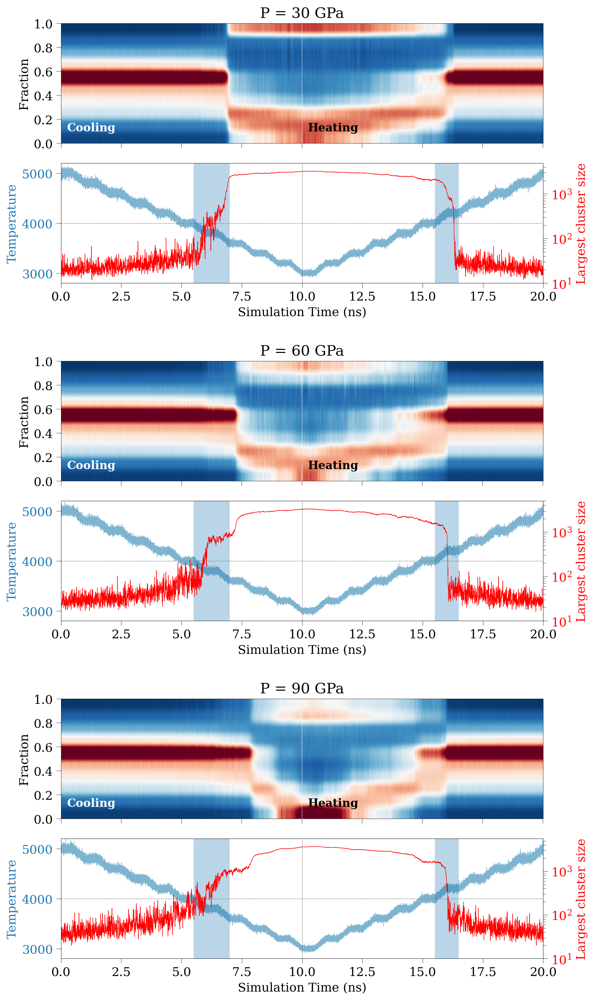

In [78]:
fig = plt.figure(figsize=(9, 15)) #(9, 5)) #(6, 5))

# Plot 30 GPa
gs1 = gridspec.GridSpec(2, 1)
ax1 = fig.add_subplot(gs1[0])
ax2 = fig.add_subplot(gs1[1])

axes = [ax1, ax2]
get_slow_md_plot(30)
axes[0].set_title("P = 30 GPa")

# tight layout with the upper 1/3 space of the figure
gs1.tight_layout(fig, rect=[0, 2/3, 1, 1])

# Plot 60 GPa
gs1 = gridspec.GridSpec(2, 1)
ax1 = fig.add_subplot(gs1[0])
ax2 = fig.add_subplot(gs1[1])

axes = [ax1, ax2]
get_slow_md_plot(60)
axes[0].set_title("P = 60 GPa")
# tight layout with the 2nd upper 1/3 space of the figure
gs1.tight_layout(fig, rect=[0, 1/3, 1, 2/3]) 

# Plot 90 GPa
gs1 = gridspec.GridSpec(2, 1)
ax1 = fig.add_subplot(gs1[0])
ax2 = fig.add_subplot(gs1[1])

axes = [ax1, ax2]
get_slow_md_plot(90)
axes[0].set_title("P = 90 GPa")
# tight layout with the lower 1/3 space of the figure
gs1.tight_layout(fig, rect=[0, 0, 1, 1/3])

In [ ]:
## save the figure
# fig.savefig("local_concentration_30_60_90.pdf")

## MD with two-phase coexistence
- Lower temperature transition from crystalline to decomposed Si + C
- We start with B3 SiC crystals, following the four-stage approach: 
    - equilibration
    - fix half, heat the other half
    - cool only the heated region
    - remove constraints on the fixed region, equilibrate the entire system
- We compute the carbon diamond fraction and carbon cluster size

### B3 zinc blende phase, B1 rock salt phase

In [79]:
def twophase_analysis(P, phase, bottom=0.25, plot_press=False):
    """
    Plot two-phase analysis for either B3 (zinc blende) or B1 (rock salt) SiC.

    Parameters
    ----------
    P : int
        Pressure in GPa
    phase : str
        "B3" or "B1"
    bottom : float
        Bottom limit of the y-axis
    plot_press : bool
        Whether to plot pressure or not
    """
    n_atoms = 16000
    max_clusters = 0
    
    for t, T in enumerate(T_list):

        ################# Plot B3/B1 SiC fractions (0 ~ 2 ns), left most
        num_diamond = []
        steps = []
        for i in [1, 2, 3, 4]:
            if phase == "B3":
                data = np.loadtxt(f"0116-0122/No_Defect/P{P}_T{T}_diamond{i}.txt", usecols=-1) / n_atoms
                num_diamond += np.reshape(data, (len(data) // 7, 7))[:, 1].tolist()
            elif phase == "B1":
                data = np.loadtxt(f"0220-0226/NoDefect_RS/T{T}/rocksalt{i}.txt", usecols=-1) / n_atoms
                num_diamond += np.reshape(data, (len(data) // 2, 2))[:, 1].tolist()
        steps = np.arange(len(num_diamond)) / 200
        ax = axes[0]
        ax.plot(steps, num_diamond, label=f"P={P}, T={T}", color=colors[t])

        ################# Plot largest cluster size (0 ~ 2 ns), middle
        num_diamond = []
        steps = []
        for i in [1, 2, 3, 4]:
            if phase == "B3":
                data = np.loadtxt(f"0116-0122/No_Defect/P{P}_T{T}_clusters{i}.txt")
            elif phase == "B1":
                data = np.loadtxt(f"0220-0226/NoDefect_RS/T{T}/clusters{i}.txt")
            num_diamond += data.tolist()
        steps = np.arange(len(data)*4) / 200
        max_clusters = max(max_clusters, np.max(num_diamond)) # to set ylim
        ax = axes[1]
        ax.plot(steps, num_diamond, label=f"P={P}, T={T}", color=colors[t])

        ################# Plot temperature in the final equilibration stage (1.5 ns ~ 2 ns), middle two
        if phase == "B3":
            log = lammps_logfile.File(f"0116-0122/No_Defect/log.P{P*10000}_T{T}")
        elif phase == "B1":
            log = lammps_logfile.File(f"0220-0226/NoDefect_RS/T{T}/log.P{P*10000}_T{T}")

        x = log.get("Step")[3000:] / 2e6
        y = log.get("Temp")[3000:]
        axes[2].plot(x, y, "--", color=colors[t])
        print(f"Final equilibrated temperature: {y[-1]:.0f} K")

        ################# Plot pressure in the final equilibration stage (1.5 ns ~ 2 ns), right most 
        if plot_press:
            for i in ["xx", "yy", "zz", "xy", "xz", "yz"]:
                y = log.get(f"P{i}")[3000:] / 1e4   # bar to GPa
                axes[3].plot(x, y, "--", color=colors[t])
                # print(y[-1])

    ## Set axis
    ax = axes[0]
    ax.set_xlim([0, 2])
    ax.set_ylim([bottom, 1.0])
    ax.vlines([0.5, 1.0, 1.5], ymin=0.0, ymax=1.0, color="gray", linestyle="--", linewidth=0.5)
    ax.set_xlabel("Simulation time (ns)")
    ax.set_ylabel(f"Fraction of {phase} SiC")
    
    ax = axes[1]
    ax.set_xlim([0, 2])
    ax.set_xlabel("Simulation time (ns)")
    ax.set_ylabel("Largest cluster size")
    ax.legend(fontsize=10)
    if phase == "B3":
        top = (max_clusters // 100 + 1) * 100
    elif phase == "B1":
        top = 125
    ax.vlines([0.5, 1.0, 1.5], ymin=0.0, ymax=top, color="gray", linestyle="--", linewidth=0.5)
    ax.set_ylim([0, top])

    axes[2].set_ylabel("Temperature (K)")
    if plot_press:
        axes[3].set_ylabel("Pressure (GPa)")

    fig.tight_layout()

### B1/B3 to decomposed Si + C [Supplementary]
- low temperature transition

Final equilibrated temperature: 3152 K
Final equilibrated temperature: 3207 K
Final equilibrated temperature: 3222 K
Final equilibrated temperature: 3391 K
Final equilibrated temperature: 3493 K
Final equilibrated temperature: 3609 K
Final equilibrated temperature: 3518 K
Final equilibrated temperature: 3521 K
Final equilibrated temperature: 3877 K
Final equilibrated temperature: 3616 K
Final equilibrated temperature: 3606 K
Final equilibrated temperature: 3608 K
Final equilibrated temperature: 4107 K
Final equilibrated temperature: 4878 K
Final equilibrated temperature: 4489 K
Final equilibrated temperature: 4549 K


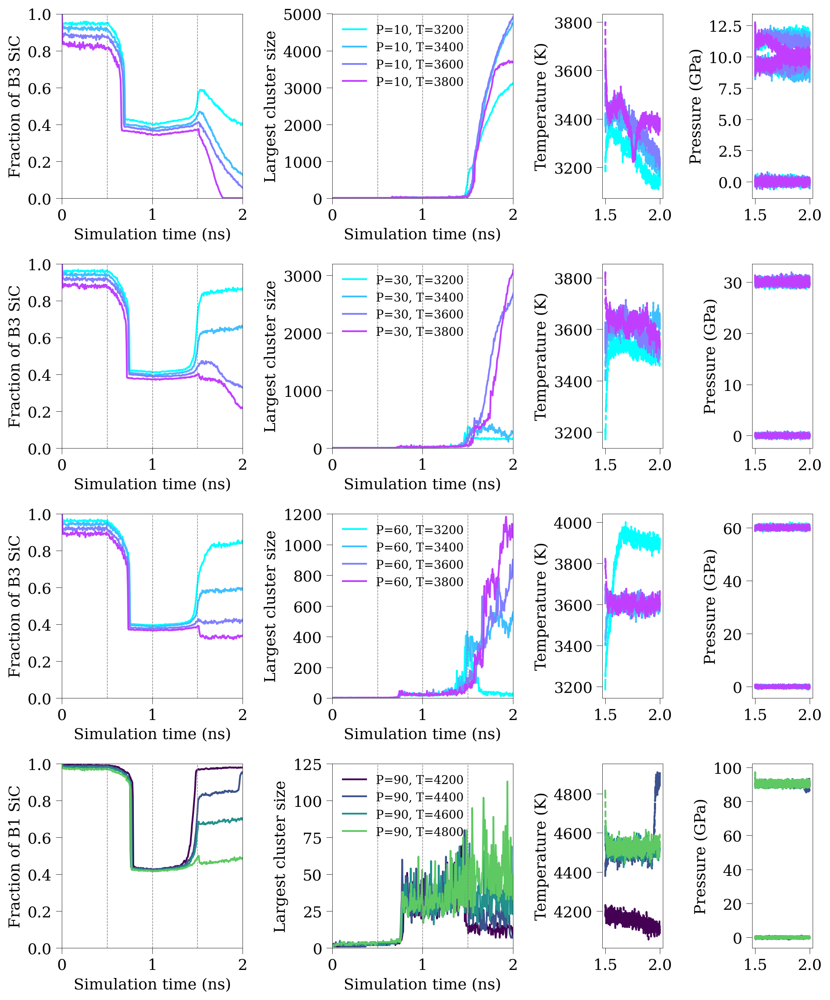

In [74]:
plot_press = True

if plot_press:
    fig, all_axes = plt.subplots(4, 4, figsize=(10, 12), width_ratios=(3, 3, 1, 1))
else:
    fig, all_axes = plt.subplots(4, 3, figsize=(10*7/8, 12), width_ratios=(3, 3, 1))

## Plot B3 SiC results at 10, 30, 60 GPa
T_list = [3200, 3400, 3600, 3800]
colors = pl.cm.cool(np.linspace(0,1,len(T_list)+1))

axes = all_axes[0, :]
twophase_analysis(10, "B3", 0, plot_press=plot_press)

axes = all_axes[1, :]
twophase_analysis(30, "B3", 0, plot_press=plot_press)

axes = all_axes[2, :]
twophase_analysis(60, "B3", 0, plot_press=plot_press)

## Plot B1 SiC results at 90 GPa
T_list = [4200, 4400, 4600, 4800]
colors = pl.cm.viridis(np.linspace(0,1,len(T_list)+1))

axes = all_axes[3, :]
twophase_analysis(90, "B1", 0, plot_press=plot_press)

In [ ]:
## save the figure
# fig.savefig("two_phase_cluster_all.pdf")

### B1/B3 to decomposed Si + C [Main]
- low temperature transition


Final equilibrated temperature: 3493 K
Final equilibrated temperature: 3609 K
Final equilibrated temperature: 3518 K
Final equilibrated temperature: 3521 K
Final equilibrated temperature: 4107 K
Final equilibrated temperature: 4878 K
Final equilibrated temperature: 4489 K
Final equilibrated temperature: 4549 K


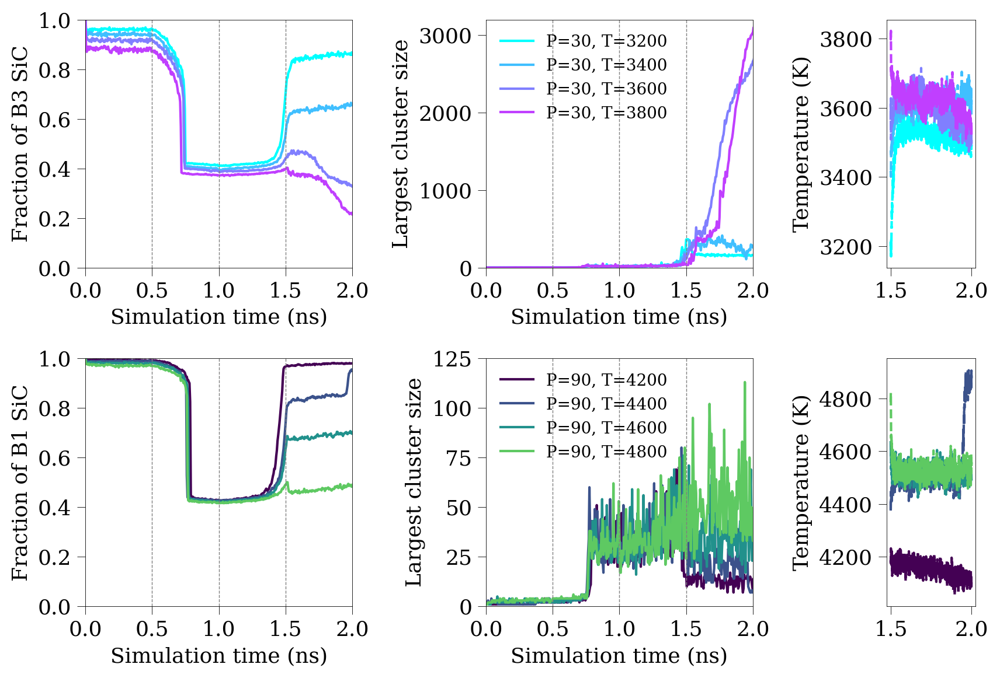

In [76]:
plot_press = False

if plot_press:
    fig, all_axes = plt.subplots(2, 4, figsize=(10, 6), width_ratios=(3, 3, 1, 1))
else:
    fig, all_axes = plt.subplots(2, 3, figsize=(10*7/8, 6), width_ratios=(3, 3, 1))

T_list = [3200, 3400, 3600, 3800]
colors = pl.cm.cool(np.linspace(0,1,len(T_list)+1))

axes = all_axes[0, :]
twophase_analysis(30, "B3", 0, plot_press=plot_press)

axes = all_axes[1, :]
T_list = [4200, 4400, 4600, 4800]
colors = pl.cm.viridis(np.linspace(0,1,len(T_list)+1))
twophase_analysis(90, "B1", 0, plot_press=plot_press)

In [ ]:
## save the figure
# fig.savefig(f"two_phase_cluster.pdf")

## Influence of defect concentration
- Check temperature convergences for all pressures and defect distributions in two-phase coexistence simulations

In [ ]:
def twophase_diamond_defect(P, defect="No_Defect"):
    """ Plot the two-phase MD simulation temperature for SiC with defects 
    
    Parameters
    ----------
    P : int
        Pressure in GPa
    defect : str
        Defect concentration
    """
    T_max = 0  # to set ylim
    for t, T in enumerate(T_list):
        
        log = lammps_logfile.File(f"0116-0122/{defect}/log.P{P*10000}_T{T}")

        x = log.get("Step")[3000:] / 1e6
        y = log.get("Temp")[3000:]
        T_max = max(T_max, np.max(y))
        axes.plot(x, y, linewidth=0.5, color=colors[t], label="$\mathrm{T}_\mathrm{init}$" + f" = {T}")

    axes.set_ylim([3000, (T_max // 1000 + 1) * 1000])

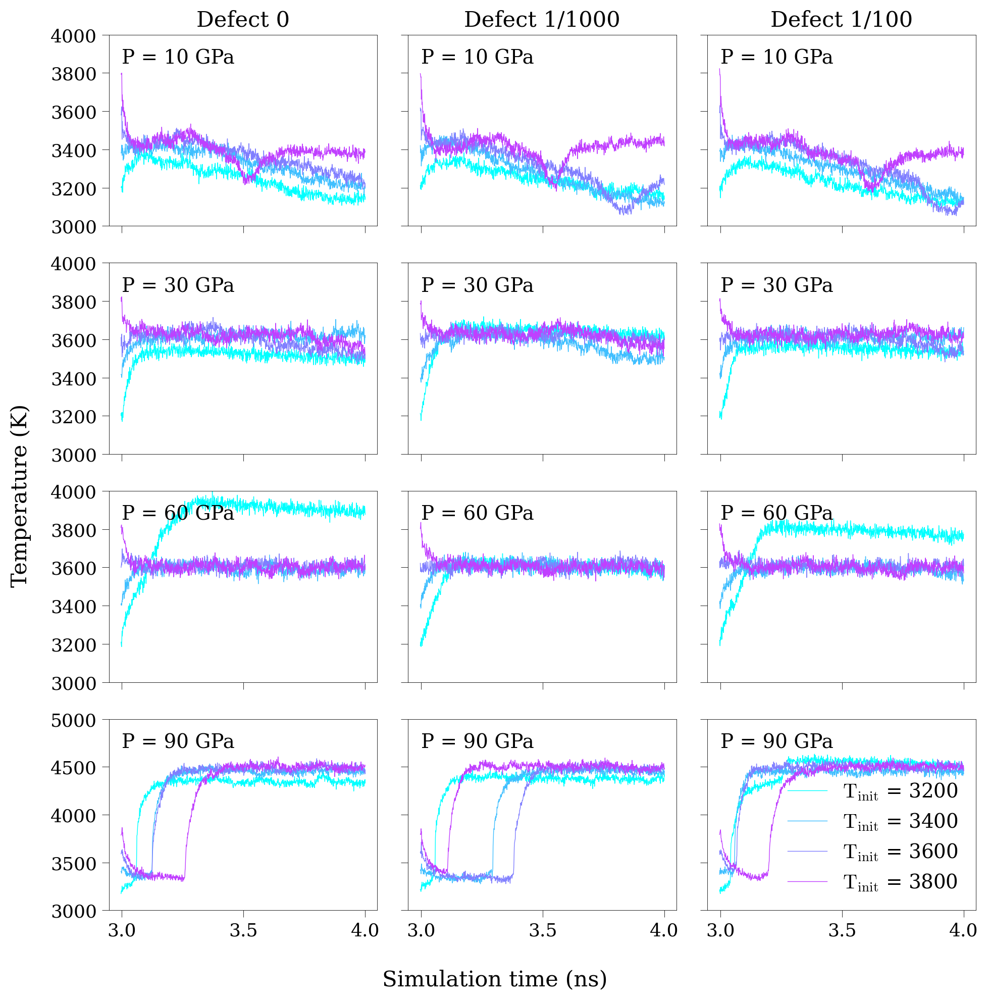

In [ ]:
fig, all_axes = plt.subplots(4, 3, figsize=(10, 10), sharex=True)

## Setup temperature and pressure range
T_list = [3200, 3400, 3600, 3800]
P_list = [10, 30, 60, 90]
colors = pl.cm.cool(np.linspace(0,1,len(T_list)+1))

for i in range(4):
    axes = all_axes[i, 0]
    twophase_diamond_defect(P_list[i], "No_Defect")
    bottom, top = axes.get_ylim()
    axes.annotate(f"P = {P_list[i]} GPa", (3, top - (top-bottom)*0.15), color="black", fontsize=14)

    axes = all_axes[i, 1]
    twophase_diamond_defect(P_list[i], "Defect_16")
    bottom, top = axes.get_ylim()
    axes.annotate(f"P = {P_list[i]} GPa", (3, top - (top-bottom)*0.15), color="black", fontsize=14)
    axes.tick_params('y', labelleft=False)

    axes = all_axes[i, 2]
    twophase_diamond_defect(P_list[i], "Defect_160")
    bottom, top = axes.get_ylim()
    axes.annotate(f"P = {P_list[i]} GPa", (3, top - (top-bottom)*0.15), color="black", fontsize=14)
    axes.tick_params('y', labelleft=False)

all_axes[0, 0].set_title("Defect 0")
all_axes[0, 1].set_title("Defect 1/1000")
all_axes[0, 2].set_title("Defect 1/100")
all_axes[-1, -1].legend(fontsize=14) 
fig.supxlabel("Simulation time (ns)")
fig.supylabel("Temperature (K)")

fig.tight_layout()

In [ ]:
# fig.savefig(f"0220-0226/two_phase_cluster_defect.pdf", bbox_inches="tight", pad_inches=0.1)

### Temperature convergence of No defect 

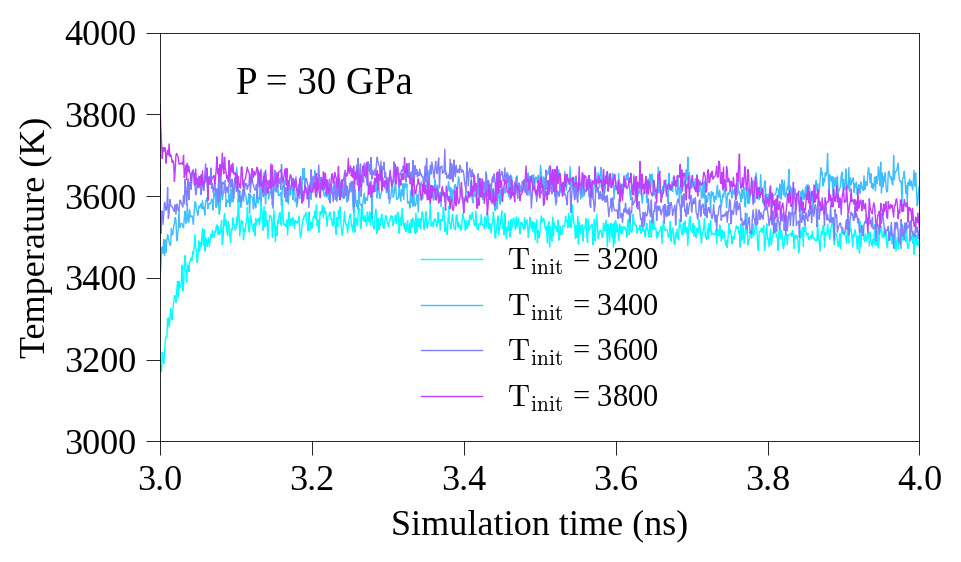

In [ ]:
fig, all_axes = plt.subplots(1, 1, figsize=(5, 3)) #, sharex=True) #, sharey=True)

T_list = [3200, 3400, 3600, 3800]
colors = pl.cm.cool(np.linspace(0,1,len(T_list)+1))
axes = all_axes
P = 30
twophase_diamond_defect(P, "No_Defect")
bottom, top = axes.get_ylim()
axes.annotate(f"P = {P} GPa", (3.1, top - (top-bottom)*0.15), color="black", fontsize=14)
#axes.tick_params('y', labelleft=False)
axes.legend(fontsize=11)

axes.set_xlabel("Simulation time (ns)")
axes.set_ylabel("Temperature (K)")
axes.set_xlim([3, 4])

#plt.subplots_adjust(wspace=0.2)
fig.tight_layout()

## ZB → RS transition at high pressure
- Coarse and fine search of transition pressures at different temperature
- Pressure unit in GPa

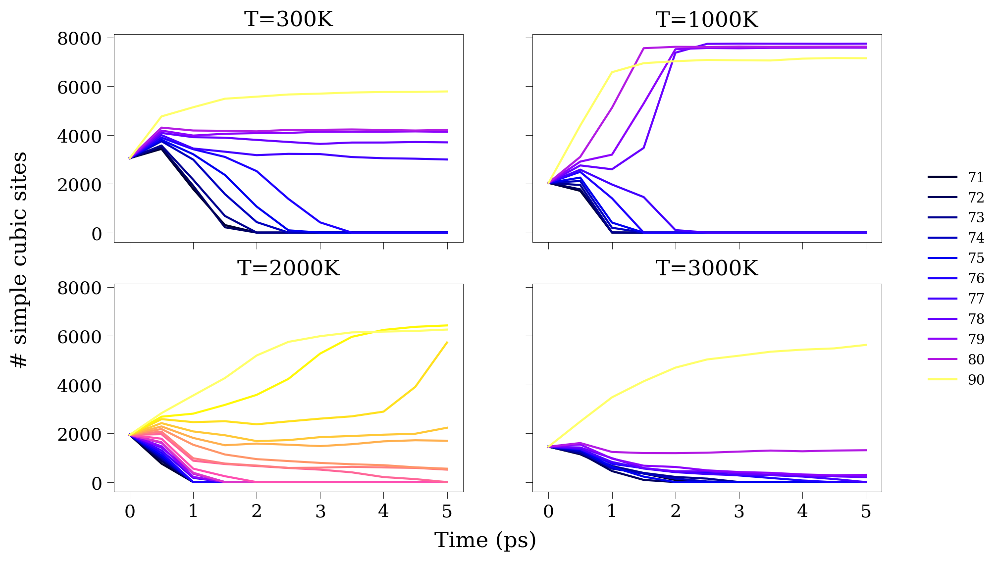

In [87]:
import glob

fig, axes = plt.subplots(2, 2, figsize=(10, 6), sharex=True, sharey=True)
n = 0
for T in [300, 1000, 2000, 3000]:
    #plt.figure(figsize=(5, 3))
    ax = axes[n//2][n%2]

    cmap = pl.cm.gnuplot2

    for P in list(range(71, 91)): # + (np.arange(771, 780)/10).tolist():
        if f"0116-0122/ZB-RS-P-search/T{T}_P{P}_ptm.txt" not in glob.glob("0116-0122/ZB-RS-P-search/*"):
            continue
        data = np.loadtxt(f"0116-0122/ZB-RS-P-search/T{T}_P{P}_ptm.txt", usecols=-1)
        data = np.reshape(data, (len(data) // 6, 6))[:, -2]
        t = np.arange(len(data)) * 0.5
        ax.plot(t, data, label=str(P), color=cmap((P-70)/21))

    ax.set_title(f"T={T}K")
    n += 1

fig.supxlabel("Time (ps)")
fig.supylabel("# simple cubic sites")
ax.legend(fontsize=10, bbox_to_anchor=(1.1, 1.6))

In [ ]:
# fig.savefig(f"0220-0226/ZB_RS_pressure_scan.pdf")

## Gas phase
- Plot volume change from MD simulation

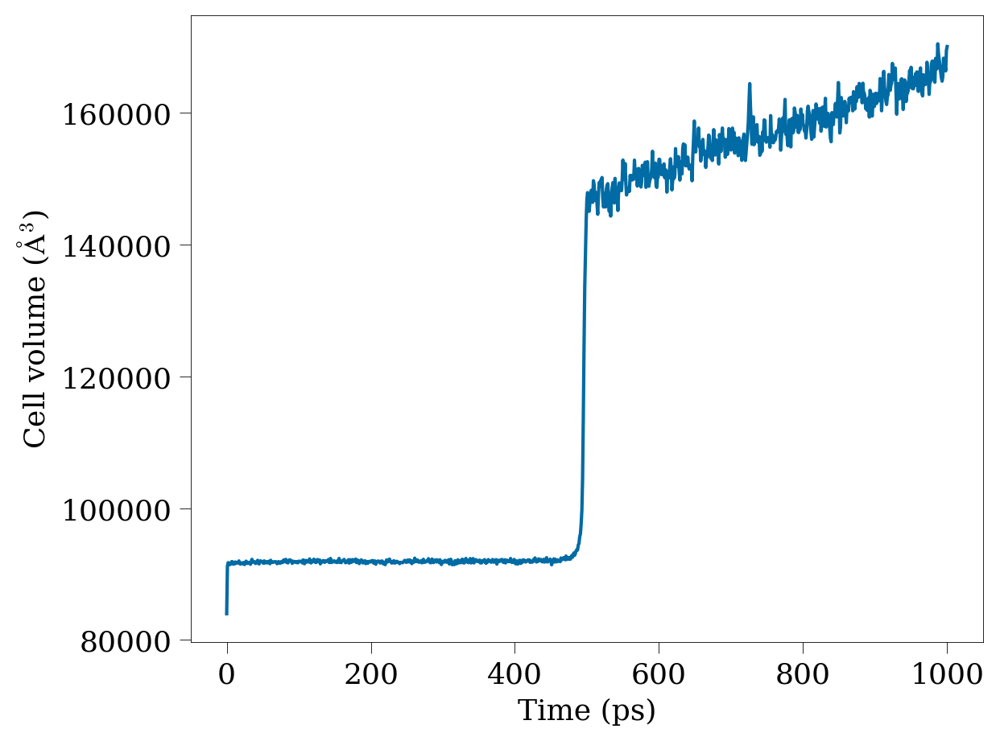

In [ ]:
volume = np.loadtxt("0123-0129/T4000_volume_0.txt")

plt.plot(volume[:,0], volume[:,1])
plt.xlabel("Time (ps)")
plt.ylabel("Cell volume ($\mathrm{\AA}^3$)")
plt.tight_layout()
# plt.savefig(f"0123-0129/gas_volume.pdf")

## Uncertainty check
- Check the uncertainty of FLARE MD simulation

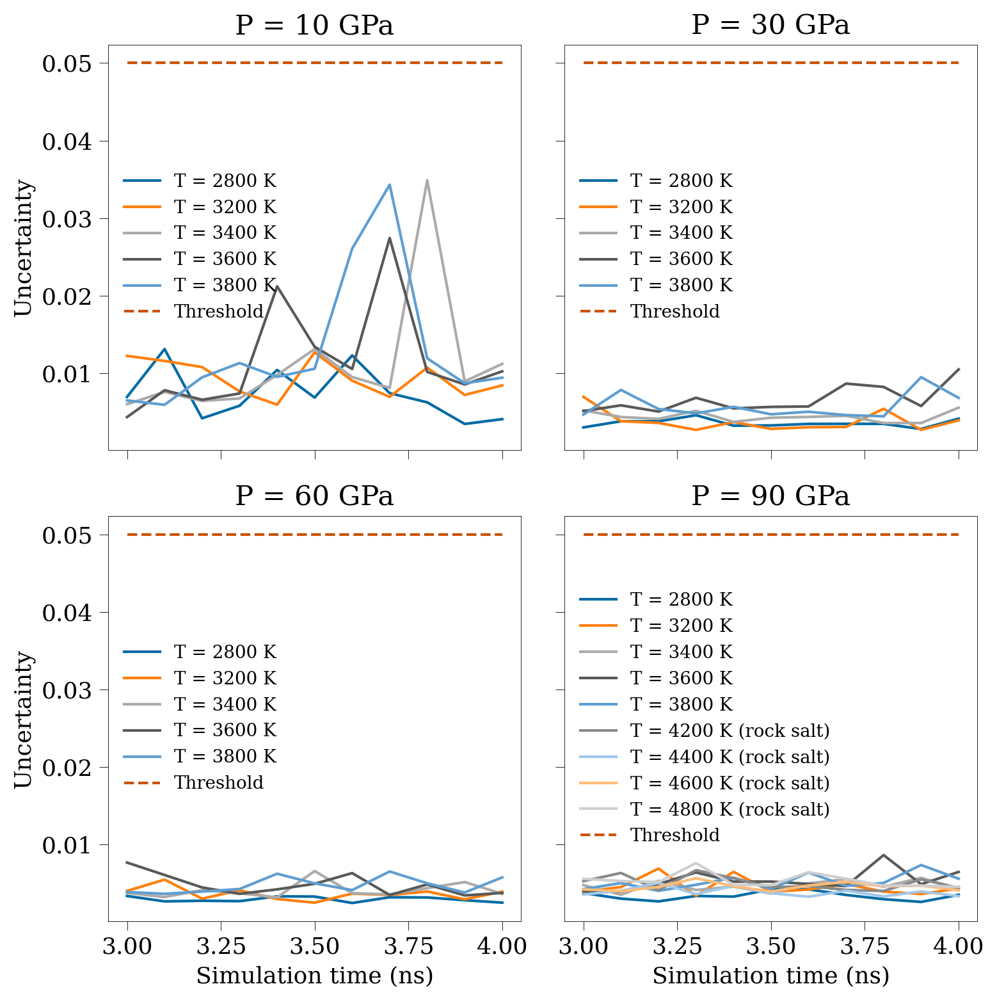

In [95]:
fig, axes = plt.subplots(2, 2, figsize=(8, 8), sharex=True, sharey=True)

i = 0
for P in [10, 30, 60, 90]:
    ax = axes[i//2, i%2]

    for T in [2800, 3200, 3400, 3600, 3800]:
        log = lammps_logfile.File(f"0220-0226/Test_Unc/log.P{P}0000_T{T}")

        x = log.get("Step") / 1e6
        y = log.get("c_MaxUnc")
        
        ax.plot(x, y, label=f"T = {T} K")

    ax.plot([x[0], x[-1]], [0.05, 0.05], "--", label="Threshold") #, color="green")
    if i // 2 == 1: ax.set_xlabel("Simulation time (ns)")
    if i % 2 == 0: ax.set_ylabel("Uncertainty")
    ax.set_title(f"P = {P} GPa")
    ax.legend(fontsize=10, loc="center left")
    i += 1

for P in [90]:
    for T in [4200, 4400, 4600, 4800]:
        log = lammps_logfile.File(f"0220-0226/Test_Unc/log.P{P}0000_T{T}_RS")

        x = log.get("Step") / 1e6
        y = log.get("c_MaxUnc")
        axes[1, 1].plot(x, y, label=f"T = {T} K (rock salt)")

handles, labels = axes[1, 1].get_legend_handles_labels()
h = handles.pop(5)
l = labels.pop(5)
handles.append(h)
labels.append(l)
axes[1, 1].legend(handles, labels, fontsize=10, loc="center left")

#fig.suptitle("Uncertainty of Two-Phase NPH MD")
fig.tight_layout()
# fig.savefig(f"0220-0226/uncertainty.pdf")

## Complete Phase diagram

1. raw version

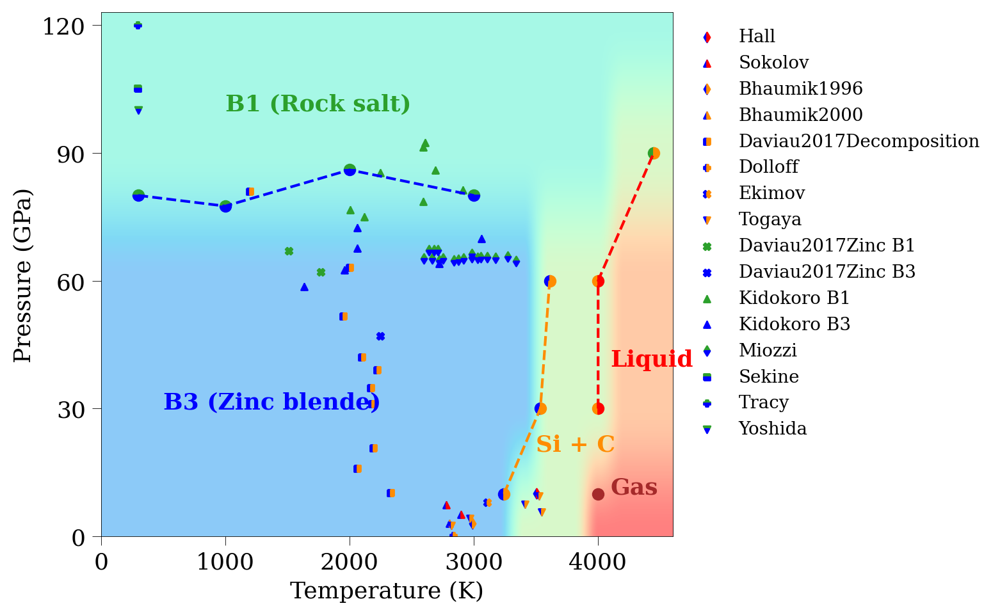

In [103]:
# T = 3000, 3200, 3400, 3600, 3800, 4000, 4200, 4400
# P = 0, 30, 60, 90, 120
fig = plt.figure(figsize=(8, 5))

c_b3 = "blue"
c_b1 = "tab:green"
c_decomp = "darkorange" #"tab:olive" #"darkkhaki"
c_liquid = "red" #"darkorange"
c_gas = "brown" #"red"

ZB = 0
RS = 1
Decomp = 2
Homo = 3
Gas = 4
HT_data = np.array([
    [RS, RS, RS, RS, RS, RS, RS, RS, RS], # 120
    [RS, RS, RS, RS, RS, RS, Decomp, Decomp, Decomp], # 90
    [ZB, ZB, ZB, Decomp, Decomp, Decomp, Homo, Homo, Homo], # 60
    [ZB, ZB, ZB, Decomp, Decomp, Decomp, Homo, Homo, Homo], # 30
    [ZB, ZB, Decomp, Decomp, Decomp, Gas, Gas, Gas, Gas], # 0
])
color_list = np.array([c_b3, c_b1, c_decomp, c_liquid, c_gas])

#plt.imshow(data, interpolation="hermite", colors=color_list[HT_data])

LT_data = np.zeros((5, 15))
LT_data[:2, :] += 1
data = np.hstack([LT_data, HT_data]) + 1
plt.imshow(data, aspect='auto', cmap="rainbow", interpolation="hermite", alpha=0.5, vmin=0)

T_offset = 0 #1000
T_step = 200
P_offset = 120
P_step = 30

shift_t = lambda x: (x - T_offset) / T_step
shift_p = lambda x: (P_offset - x) / P_step

# B3 <--> Si + C
LT_bound = np.array([(3243.05, 10), (3535.33, 30), (3610.29, 60)])
plt.plot(shift_t(LT_bound[:, 0]), shift_p(LT_bound[:, 1]), "--", color=c_decomp)
plt.scatter(shift_t(LT_bound[:, 0]), shift_p(LT_bound[:, 1]), marker=MarkerStyle("o", fillstyle="left"), color=c_b3) #, edgecolor="black")
plt.scatter(shift_t(LT_bound[:, 0]), shift_p(LT_bound[:, 1]), marker=MarkerStyle("o", fillstyle="right"), color=c_decomp) #, edgecolor="black")

# Si + C <--> liquid
HT_bound = np.array([(4000, 30), (4000, 60)]) #, (4447.91, 90)])
plt.scatter(shift_t(HT_bound[:, 0]), shift_p(HT_bound[:, 1]), marker=MarkerStyle("o", fillstyle="left"), color=c_decomp) #, edgewidth=0)
plt.scatter(shift_t(HT_bound[:, 0]), shift_p(HT_bound[:, 1]), marker=MarkerStyle("o", fillstyle="right"), color=c_liquid) #, edgewidth=0)

# B1 <--> liquid
plt.scatter(shift_t(4447.91), shift_p(90), marker=MarkerStyle("o", fillstyle="left"), color=c_b1)
plt.scatter(shift_t(4447.91), shift_p(90), marker=MarkerStyle("o", fillstyle="right"), color=c_decomp)
plt.plot(shift_t(np.array(HT_bound[:, 0].tolist() + [4447.91])), 
         shift_p(np.array(HT_bound[:, 1].tolist() + [90])), 
         "--", color=c_liquid)

# B3 <--> B1
zb_rs_t = np.array([300, 1000, 2000, 3000])
zb_rs_p = np.array([80, 77.5, 86, 80]) 
plt.plot(shift_t(zb_rs_t), shift_p(zb_rs_p), "--", color=c_b3)
plt.scatter(shift_t(zb_rs_t), shift_p(zb_rs_p), marker=MarkerStyle("o", fillstyle="top"), color=c_b1) #, edgewidth=0)
plt.scatter(shift_t(zb_rs_t), shift_p(zb_rs_p), marker=MarkerStyle("o", fillstyle="bottom"), color=c_b3) #, edgewidth=0)

# Annotation
plt.annotate(text="B3 (Zinc blende)", xy=(shift_t(500), shift_p(30)), color=c_b3, weight="bold")
plt.annotate(text="B1 (Rock salt)", xy=(shift_t(1000), shift_p(100)), color=c_b1, weight="bold")
plt.annotate(text="Si + C", xy=(shift_t(3500), shift_p(20)), color=c_decomp, weight="bold")
plt.annotate(text="Liquid", xy=(shift_t(4100), shift_p(40)), color=c_liquid, weight="bold")
plt.annotate(text="Gas", xy=(shift_t(4100), shift_p(10)), color=c_gas, weight="bold")

# Gas
plt.scatter(shift_t(4000), shift_p(10), marker="o", color=c_gas)

# Experiment
def plot_exp_half(name, marker, color):
    data = np.loadtxt(f"Experiment/{name}.csv", delimiter=",")
    if len(data.shape) == 1:
        x = shift_t(data[0])
        y = shift_p(data[1]) 
    else:
        x = shift_t(data[:, 0])
        y = shift_p(data[:, 1])
    myplt = plt.scatter(x, y, marker=marker, s=15, color=color)
    return myplt

def plot_exp(name, markershape, colors, fillstyle="lr"):
    if fillstyle == "lr":
        f1, f2 = "left", "right"
    elif fillstyle == "tb":
        f1, f2 = "top", "bottom" 
    m1 = plot_exp_half(name, MarkerStyle(markershape, fillstyle=f1), colors[0])
    m2 = plot_exp_half(name, MarkerStyle(markershape, fillstyle=f2), colors[1])
    handle_list.append((m1, m2))
    label = name.split("/")[-1].replace("_", " ")
    label_list.append(label)

handle_list = []
label_list = []

plot_exp("Congruent/Hall", "d", [c_b3, c_liquid])
plot_exp("Congruent/Sokolov", "^", [c_b3, c_liquid])

plot_exp("Decomposition/Bhaumik1996", "d", [c_b3, c_decomp])
plot_exp("Decomposition/Bhaumik2000", "^", [c_b3, c_decomp])
plot_exp("Decomposition/Daviau2017Decomposition", "s", [c_b3, c_decomp])
plot_exp("Decomposition/Dolloff", "P", [c_b3, c_decomp])
plot_exp("Decomposition/Ekimov", "X", [c_b3, c_decomp])
plot_exp("Decomposition/Togaya", "v", [c_b3, c_decomp])

plot_exp("B3_to_B1/Daviau2017Zinc_B1", "X", [c_b1, c_b1])
plot_exp("B3_to_B1/Daviau2017Zinc_B3", "X", [c_b3, c_b3])
plot_exp("B3_to_B1/Kidokoro_B1", "^", [c_b1, c_b1])
plot_exp("B3_to_B1/Kidokoro_B3", "^", [c_b3, c_b3])

plot_exp("B3_to_B1/Miozzi", "d", [c_b1, c_b3], "tb")
plot_exp("B3_to_B1/Sekine", "s", [c_b1, c_b3], "tb")
plot_exp("B3_to_B1/Tracy", "P", [c_b1, c_b3], "tb")
plot_exp("B3_to_B1/Yoshida", "v", [c_b1, c_b3], "tb")

plt.legend(handle_list, label_list, numpoints=1, bbox_to_anchor=(1.0, 1.0), fontsize=10, loc='upper left')
plt.xticks([0, 5, 10, 15, 20, 25], labels=[0, 1000, 2000, 3000, 4000, 5000])
plt.xlabel("Temperature (K)")
plt.ylim([4, -0.1])
plt.xlim([0, 23])
plt.yticks([0, 1, 2, 3, 4], labels=[120, 90, 60, 30, 0])
plt.ylabel("Pressure (GPa)")
plt.tight_layout()

2. smoothly interpolated version

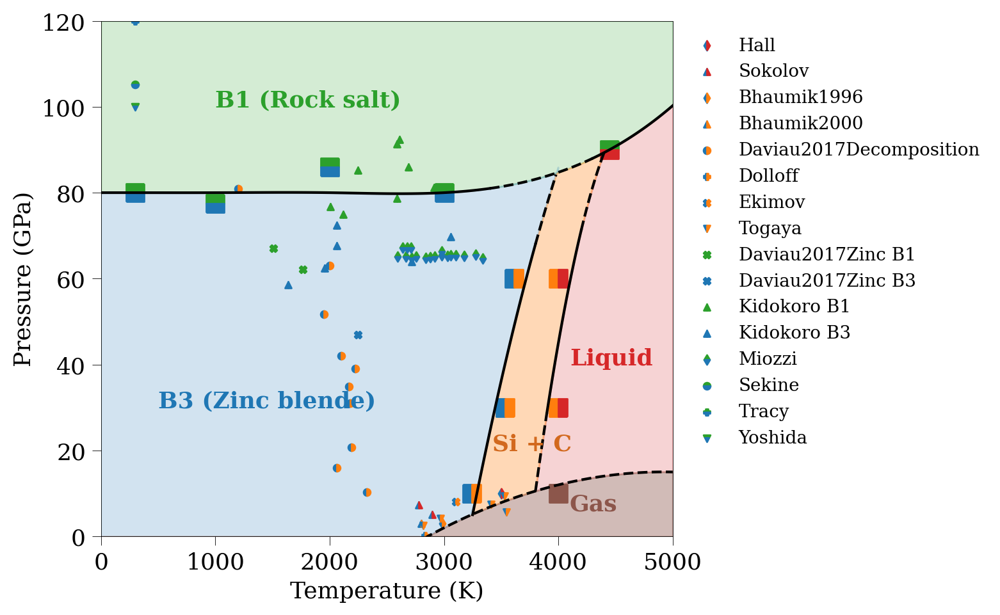

In [104]:
import scipy

# T = 3000, 3200, 3400, 3600, 3800, 4000, 4200, 4400
# P = 0, 30, 60, 90, 120
fig = plt.figure(figsize=(8, 5))

c_b3 = "tab:blue"
c_b1 = "tab:green"
c_decomp = "tab:orange" #"tab:olive" #"darkkhaki"
c_liquid = "tab:red" #"darkorange"
c_gas = "tab:brown" #"red"

shift_t = lambda x: x
shift_p = lambda x: x


# Regression for phase boundary curve between gas and other phases
inferred_boundary_T = np.array([3000, 4000, 5000])
inferred_boundary_P = np.array([2, 12, 15])
P_regress_gas = np.polyfit(inferred_boundary_T, inferred_boundary_P, 2)
P_regress_p = np.linspace(2500, 5000, 100)
P_regress_t = np.polyval(P_regress_gas, P_regress_p)
plt.plot(shift_t(P_regress_p), shift_p(P_regress_t), "--", color="black")


# Regression for phase boundary curve between B1 and other phases
inferred_boundary_T = np.array([0, 300, 1000, 2000, 3000, 4447.91])
inferred_boundary_P = np.array([80, 80, 80, 80, 80, 90])
P_regress_b1 = scipy.interpolate.CubicSpline(inferred_boundary_T, inferred_boundary_P)
P_regress_p = np.linspace(0, 3400, 100)
P_regress_t = P_regress_b1(P_regress_p)
plt.plot(shift_t(P_regress_p), shift_p(P_regress_t), "-", color="black")
P_regress_p = np.linspace(3400, 4300, 100)
P_regress_t = P_regress_b1(P_regress_p)
plt.plot(shift_t(P_regress_p), shift_p(P_regress_t), "--", color="black")
P_regress_p = np.linspace(4300, 5000, 100)
P_regress_t = P_regress_b1(P_regress_p)
plt.plot(shift_t(P_regress_p), shift_p(P_regress_t), "-", color="black")

# Regression for phase boundary curve between B3 and other phases
inferred_boundary_T = np.array([3243.05, 3535.33, 3610.29, 4000, 3300])
inferred_boundary_P = np.array([10, 30, 60, P_regress_b1(4000), np.polyval(P_regress_gas, 3300)])
P_regress_b3 = np.polyfit(inferred_boundary_T, inferred_boundary_P, 2)
P_regress_t = np.linspace(3250, 3800, 100)
P_regress_p = np.polyval(P_regress_b3, P_regress_t)
plt.plot(shift_t(P_regress_t), shift_p(P_regress_p), "-", color="black")
P_regress_t = np.linspace(3800, 3980, 100)
P_regress_p = np.polyval(P_regress_b3, P_regress_t)
plt.plot(shift_t(P_regress_t), shift_p(P_regress_p), "--", color="black")


# Regression for phase boundary curve between liquid and other phases
inferred_boundary_T = np.array([4000, 4000, 4400, 3800])
inferred_boundary_P = np.array([30, 60, P_regress_b1(4400), np.polyval(P_regress_gas, 3800)])
P_regress_liquid = np.polyfit(inferred_boundary_T, inferred_boundary_P, 2)
P_regress_t = np.linspace(3800, 3900, 100)
P_regress_p = np.polyval(P_regress_liquid, P_regress_t)
plt.plot(P_regress_t, P_regress_p, "--", color="black")
P_regress_t = np.linspace(3900, 4200, 100)
P_regress_p = np.polyval(P_regress_liquid, P_regress_t)
plt.plot(P_regress_t, P_regress_p, color="black")
P_regress_t = np.linspace(4200, 4400, 100)
P_regress_p = np.polyval(P_regress_liquid, P_regress_t)
plt.plot(P_regress_t, P_regress_p, "--", color="black")


# Annotation
plt.annotate(text="B3 (Zinc blende)", xy=(shift_t(500), shift_p(30)), color=c_b3, weight="bold")
plt.annotate(text="B1 (Rock salt)", xy=(shift_t(1000), shift_p(100)), color=c_b1, weight="bold")
plt.annotate(text="Si + C", xy=(shift_t(3420), shift_p(20)), color="chocolate", weight="bold")
plt.annotate(text="Liquid", xy=(shift_t(4100), shift_p(40)), color=c_liquid, weight="bold")
plt.annotate(text="Gas", xy=(shift_t(4100), shift_p(6)), color=c_gas, weight="bold")


# Fill color between in each phase
# Fill green color for B1 phase
T_fill = np.linspace(0, 5000, 100)
P_fill = P_regress_b1(T_fill)
plt.fill_between(shift_t(T_fill), shift_p(P_fill), 120, color=c_b1, alpha=0.2)

# Fill blue color for B3 phase
T_fill = np.linspace(0, 4000, 100)
P_fill_b1 = P_regress_b1(T_fill)
P_fill_lower = np.max(np.array([np.polyval(P_regress_gas, T_fill), np.polyval(P_regress_b3, T_fill)]), axis=0)
# P_fill_gas = np.polyval(P_regress_gas, T_fill)
plt.fill_between(shift_t(T_fill), shift_p(P_fill_lower), shift_p(P_fill_b1), color=c_b3, alpha=0.2)

# Fill orange color for liquid phase
# T_regress_p = np.linspace(np.polyval(P_regress_gas, 3800), P_regress_b1(4400), 100)
# T_regress_t = np.polyval(T_regress_b3, T_regress_p)
# plt.fill_between(shift_t(T_regress_t), shift_p(T_regress_p), shift_p(P_fill_b1), where=(T_regress_t < 4400), color=c_liquid, alpha=0.2)
T_fill = np.linspace(3800, 5000, 100)
P_fill_upper = np.min(np.array([P_regress_b1(T_fill), np.polyval(P_regress_liquid, T_fill) * (T_fill < 4500) + 100 * (T_fill >= 4500)]), axis=0)
P_fill_gas = np.polyval(P_regress_gas, T_fill)
plt.fill_between(shift_t(T_fill), shift_p(P_fill_gas), shift_p(P_fill_upper), color=c_liquid, alpha=0.2)

# Fill yellow color for decomposed phase
T_fill = np.linspace(3250, 4400, 100)
P_fill_upper = np.min(np.array([P_regress_b1(T_fill), np.polyval(P_regress_b3, T_fill) * (T_fill < 4000) + 100 * (T_fill >= 4000)]), axis=0)
P_fill_lower = np.max(np.array([np.polyval(P_regress_liquid, T_fill), np.polyval(P_regress_gas, T_fill) * (T_fill < 3800) + 0 * (T_fill >= 3800)]), axis=0)
plt.fill_between(shift_t(T_fill), shift_p(P_fill_lower), shift_p(P_fill_upper), color=c_decomp, alpha=0.3)


# Fill red color for gas phase
T_fill = np.linspace(0, 5000, 100)
P_fill_b1 = P_regress_b1(T_fill)
P_fill_gas = np.polyval(P_regress_gas, T_fill)
plt.fill_between(shift_t(T_fill), 0, shift_p(P_fill_gas), color=c_gas, alpha=0.4)



# B3 <--> Si + C
LT_bound = np.array([(3243.05, 10), (3535.33, 30), (3610.29, 60)])
# plt.plot(shift_t(LT_bound[:, 0]), shift_p(LT_bound[:, 1]), "--", color=c_decomp)
plt.scatter(shift_t(LT_bound[:, 0]), shift_p(LT_bound[:, 1]), marker=MarkerStyle("s", fillstyle="left"), s=100, color=c_b3) #, edgecolor="black")
plt.scatter(shift_t(LT_bound[:, 0]), shift_p(LT_bound[:, 1]), marker=MarkerStyle("s", fillstyle="right"), s=100, color=c_decomp) #, edgecolor="black")

# Si + C <--> liquid
HT_bound = np.array([(4000, 30), (4000, 60)]) #, (4447.91, 90)])
plt.scatter(shift_t(HT_bound[:, 0]), shift_p(HT_bound[:, 1]), marker=MarkerStyle("s", fillstyle="left"), s=100, color=c_decomp) #, edgewidth=0)
plt.scatter(shift_t(HT_bound[:, 0]), shift_p(HT_bound[:, 1]), marker=MarkerStyle("s", fillstyle="right"), s=100, color=c_liquid) #, edgewidth=0)

# B1 <--> liquid
plt.scatter(shift_t(4447.91), shift_p(90), marker=MarkerStyle("s", fillstyle="top"), s=100, color=c_b1)
plt.scatter(shift_t(4447.91), shift_p(90), marker=MarkerStyle("s", fillstyle="bottom"), s=100, color=c_liquid)
# plt.plot(shift_t(np.array(HT_bound[:, 0].tolist() + [4447.91])), 
#          shift_p(np.array(HT_bound[:, 1].tolist() + [90])), 
#          "--", color=c_liquid)

# B3 <--> B1
zb_rs_t = np.array([300, 1000, 2000, 3000])
zb_rs_p = np.array([80, 77.5, 86, 80]) 
# plt.plot(shift_t(zb_rs_t), shift_p(zb_rs_p), "--", color=c_b3)
plt.scatter(shift_t(zb_rs_t), shift_p(zb_rs_p), marker=MarkerStyle("s", fillstyle="top"), s=100, color=c_b1) #, edgewidth=0)
plt.scatter(shift_t(zb_rs_t), shift_p(zb_rs_p), marker=MarkerStyle("s", fillstyle="bottom"), s=100, color=c_b3) #, edgewidth=0)

# Gas
plt.scatter(shift_t(4000), shift_p(10), marker="s", s=100, color=c_gas)

# Experiment
def plot_exp_half(name, marker, color):
    data = np.loadtxt(f"Experiment/{name}.csv", delimiter=",")
    if len(data.shape) == 1:
        x = shift_t(data[0])
        y = shift_p(data[1]) 
    else:
        x = shift_t(data[:, 0])
        y = shift_p(data[:, 1])
    myplt = plt.scatter(x, y, marker=marker, s=15, color=color)
    return myplt

def plot_exp(name, markershape, colors, fillstyle="lr"):
    if fillstyle == "lr":
        f1, f2 = "left", "right"
    elif fillstyle == "tb":
        f1, f2 = "top", "bottom" 
    m1 = plot_exp_half(name, MarkerStyle(markershape, fillstyle=f1), colors[0])
    m2 = plot_exp_half(name, MarkerStyle(markershape, fillstyle=f2), colors[1])
    handle_list.append((m1, m2))
    label = name.split("/")[-1].replace("_", " ")
    label_list.append(label)

handle_list = []
label_list = []

plot_exp("Congruent/Hall", "d", [c_b3, c_liquid])
plot_exp("Congruent/Sokolov", "^", [c_b3, c_liquid])

plot_exp("Decomposition/Bhaumik1996", "d", [c_b3, c_decomp])
plot_exp("Decomposition/Bhaumik2000", "^", [c_b3, c_decomp])
plot_exp("Decomposition/Daviau2017Decomposition", "o", [c_b3, c_decomp])
plot_exp("Decomposition/Dolloff", "P", [c_b3, c_decomp])
plot_exp("Decomposition/Ekimov", "X", [c_b3, c_decomp])
plot_exp("Decomposition/Togaya", "v", [c_b3, c_decomp])

plot_exp("B3_to_B1/Daviau2017Zinc_B1", "X", [c_b1, c_b1])
plot_exp("B3_to_B1/Daviau2017Zinc_B3", "X", [c_b3, c_b3])
plot_exp("B3_to_B1/Kidokoro_B1", "^", [c_b1, c_b1])
plot_exp("B3_to_B1/Kidokoro_B3", "^", [c_b3, c_b3])

plot_exp("B3_to_B1/Miozzi", "d", [c_b1, c_b3], "tb")
plot_exp("B3_to_B1/Sekine", "o", [c_b1, c_b3], "tb")
plot_exp("B3_to_B1/Tracy", "P", [c_b1, c_b3], "tb")
plot_exp("B3_to_B1/Yoshida", "v", [c_b1, c_b3], "tb")

plt.legend(handle_list, label_list, numpoints=1, bbox_to_anchor=(1.0, 1.0), fontsize=10)

# plt.xticks([0, 5, 10, 15, 20, 25], labels=[0, 1000, 2000, 3000, 4000, 5000])
plt.xlabel("Temperature (K)")
# plt.ylim([4, -0.1])
# plt.xlim([0, 23])
# plt.yticks([0, 1, 2, 3, 4], labels=[120, 90, 60, 30, 0])
plt.xlim([0, 5000])
plt.ylim([0, 120])
plt.ylabel("Pressure (GPa)")
plt.tight_layout()

In [ ]:
# fig.savefig("phase_diagram.pdf")

Abbr. Phase diagram

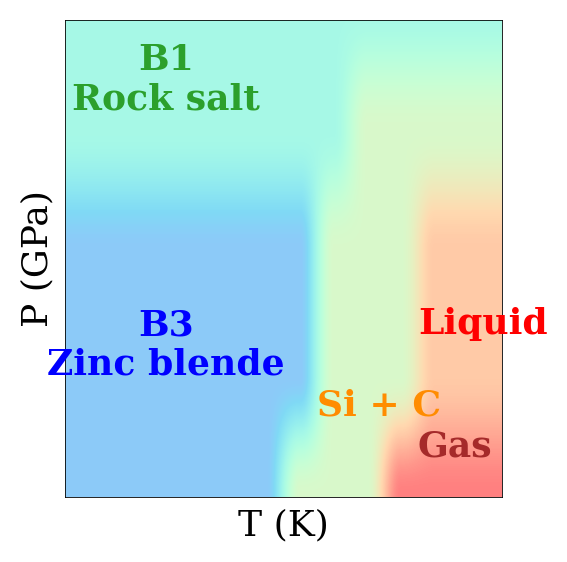

In [105]:
# T = 3000, 3200, 3400, 3600, 3800, 4000, 4200, 4400
# P = 0, 30, 60, 90, 120
fig = plt.figure(figsize=(3, 3))

c_b3 = "blue"
c_b1 = "tab:green"
c_decomp = "darkorange" #"tab:olive" #"darkkhaki"
c_liquid = "red" #"darkorange"
c_gas = "brown" #"red"

ZB = 0
RS = 1
Decomp = 2
Homo = 3
Gas = 4
HT_data = np.array([
    [RS, RS, RS, RS, RS, RS, RS, RS, RS], # 120
    [RS, RS, RS, RS, Decomp, Decomp, Decomp, Decomp, Decomp], # 90
    [ZB, ZB, ZB, Decomp, Decomp, Decomp, Homo, Homo, Homo], # 60
    [ZB, ZB, ZB, Decomp, Decomp, Decomp, Homo, Homo, Homo], # 30
    [ZB, ZB, Decomp, Decomp, Decomp, Gas, Gas, Gas, Gas], # 0
])
color_list = np.array([c_b3, c_b1, c_decomp, c_liquid, c_gas])

#plt.imshow(data, interpolation="hermite", colors=color_list[HT_data])

LT_data = np.zeros((5, 15))
LT_data[:2, :] += 1
data = np.hstack([LT_data, HT_data]) + 1
plt.imshow(data, aspect='auto', cmap="rainbow", interpolation="hermite", alpha=0.5, vmin=0)

T_offset = 0 #1000
T_step = 200
P_offset = 120
P_step = 30

shift_t = lambda x: (x - T_offset) / T_step
shift_p = lambda x: (P_offset - x) / P_step

# Annotation
plt.annotate(text="B3\nZinc blende", xy=(shift_t(2600), shift_p(30)), color=c_b3, weight="bold", horizontalalignment='center')
plt.annotate(text="B1\nRock salt", xy=(shift_t(2600), shift_p(95)), color=c_b1, weight="bold", horizontalalignment='center')
plt.annotate(text="Si + C", xy=(shift_t(3500), shift_p(20)), color=c_decomp, weight="bold")
plt.annotate(text="Liquid", xy=(shift_t(4100), shift_p(40)), color=c_liquid, weight="bold")
plt.annotate(text="Gas", xy=(shift_t(4100), shift_p(10)), color=c_gas, weight="bold")

plt.xticks([]) #[0, 5, 10, 15, 20, 25], labels=[0, 1000, 2000, 3000, 4000, 5000])
plt.xlabel("T (K)")
plt.ylim([4, 0.1])
plt.xlim([10, 23])
plt.yticks([]) #[0, 1, 2, 3, 4], labels=[120, 90, 60, 30, 0])
plt.ylabel("P (GPa)")
plt.tight_layout()

# OVITO usage

In [ ]:
import ovito
from ovito.io import import_file, export_file
import matplotlib.pyplot as plt
import math
from ovito.vis import Viewport
from IPython.display import Image
from ovito.vis import TachyonRenderer

from ovito.modifiers import ComputePropertyModifier, PolyhedralTemplateMatchingModifier
from ovito.modifiers import CoordinationAnalysisModifier

## 512k atoms snapshot
- Use polyhedra template matching to find decomposed structures

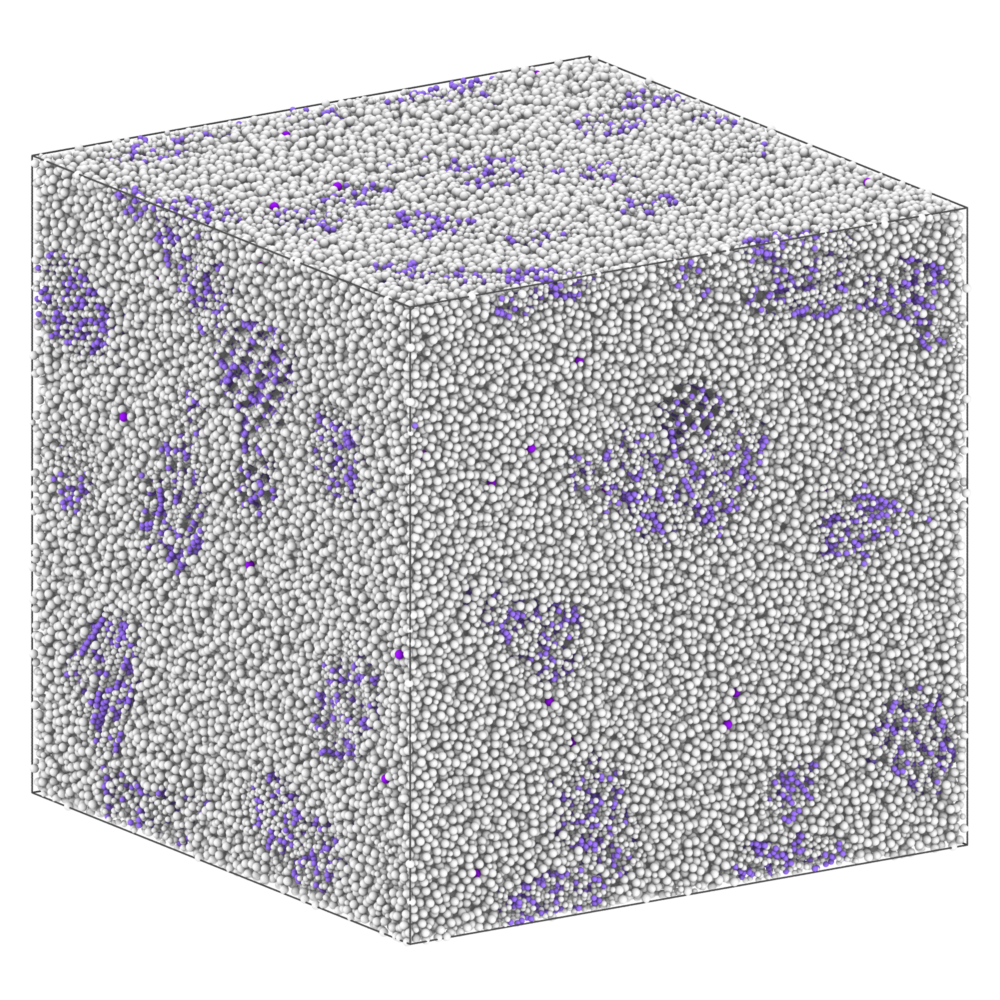

In [7]:
from ovito.modifiers import ComputePropertyModifier, PolyhedralTemplateMatchingModifier

# Change red and blue atoms to Si and C
path = "0123-0129/512k_atoms_cool/P30"
pipeline = import_file(f"{path}/3coolend_final.xyz")
pipeline.modifiers.append(ComputePropertyModifier(output_property='Radius', expressions=['(ParticleType==1)*0.78+(ParticleType==2)*1.18']))
pipeline.modifiers.append(ComputePropertyModifier(output_property='Color', expressions=[
    '(ParticleType==1)*0.5+(ParticleType==2)*0.9',
    '(ParticleType==1)*0.5+(ParticleType==2)*0.75',
    '(ParticleType==1)*0.5+(ParticleType==2)*0.55',
]))

#Calculate per-particle displacements with respect to initial simulation frame:
ptm = PolyhedralTemplateMatchingModifier()
ptm.rmsd_cutoff = 0.16
ptm.structures[PolyhedralTemplateMatchingModifier.Type.SC].enabled = True
ptm.structures[PolyhedralTemplateMatchingModifier.Type.CUBIC_DIAMOND].enabled = True
ptm.structures[PolyhedralTemplateMatchingModifier.Type.GRAPHENE].enabled = True
pipeline.modifiers.append(ptm)

cell_vis = pipeline.source.data.cell.vis
cell_vis.line_width = 0.2
cell_vis.rendering_color = (0.3, 0.3, 0.3)

# Plot
del ovito.scene.pipelines[:]
pipeline.add_to_scene()

vp = Viewport()
vp.type = Viewport.Type.Front
#vp.camera_pos = (-10, -15, 15)
vp.camera_dir = (2, 3, -1)
#vp.fov = math.radians(60.0)
vp.zoom_all()

tachyon = TachyonRenderer(shadows=False, direct_light_intensity=1.1)
figfile = f"{path}/figure_ptm.png"
vp.render_image(filename=figfile, background=(1,1,1), renderer=tachyon, size=(2000, 2000), alpha=1.0)

Image(figfile)

## RDF calculation

In [112]:
from ovito.modifiers import CoordinationAnalysisModifier

path = "0123-0129/512k_atoms_cool/P60"
pipeline = import_file(f"{path}/3coolend_final.xyz")
for t in pipeline.compute().particles.particle_types.types:
    print("Type %i: %s" % (t.id, t.name))

pipeline.modifiers.append(CoordinationAnalysisModifier(cutoff=7.0, number_of_bins=200, partial=True))

# Access the output DataTable:
rdf_table = pipeline.compute().tables['coordination-rdf']

Type 1: 
Type 2: 


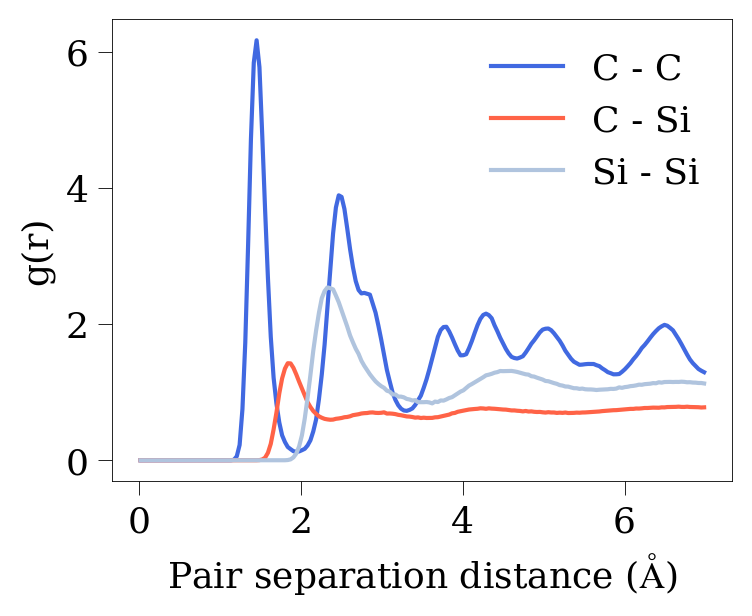

In [ ]:
#print(rdf_table.xy())
plt.figure(figsize=(4, 3))
plt.plot(rdf_table.xy()[:, 0], rdf_table.xy()[:, 1], label="C - C", color="royalblue")
plt.plot(rdf_table.xy()[:, 0], rdf_table.xy()[:, 2], label="C - Si", color="tomato")
plt.plot(rdf_table.xy()[:, 0], rdf_table.xy()[:, 3], label="Si - Si", color="lightsteelblue")
plt.xlabel("Pair separation distance ($\mathrm{\AA}$)")
plt.ylabel("g(r)")
plt.legend()
# plt.savefig(f"{path}/rdf.png", dpi=400, bbox_inches="tight", pad_inches=0.1)

### Calculate RDF across different pressures

In [12]:
rdf_list = []
for P in [30, 60, 80]:
    print(P)
    path = f"0123-0129/512k_atoms_cool/P{P}"
    rdfs = []
    for j, trj in enumerate(["1start", "3coolend"]):
        pipeline = import_file(f"{path}/{trj}_final.xyz")
        pipeline.modifiers.append(CoordinationAnalysisModifier(cutoff=7.0, number_of_bins=200, partial=True))
        rdf_table = pipeline.compute().tables['coordination-rdf']
        rdfs.append(rdf_table)
    rdf_list.append(rdfs)

30
60
80


30
60
80


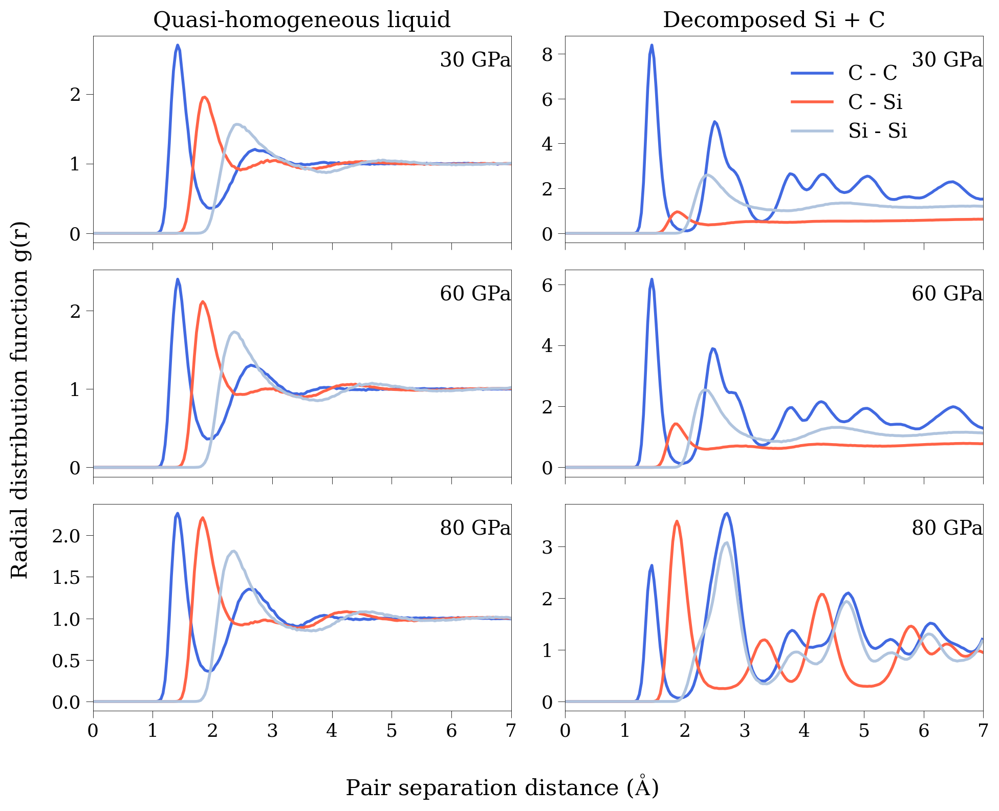

In [14]:
fig, axes = plt.subplots(3, 2, figsize=(10, 8), sharex=True)
for i, P in enumerate([30, 60, 80]):
    print(P)
    path = f"0123-0129/512k_atoms_cool/P{P}"
    for j, trj in enumerate(["1start", "3coolend"]):
        rdf_table = rdf_list[i][j]
        ax = axes[i, j]
        ax.plot(rdf_table.xy()[:, 0], rdf_table.xy()[:, 1], label="C - C", color="royalblue", linewidth=2)
        ax.plot(rdf_table.xy()[:, 0], rdf_table.xy()[:, 2], label="C - Si", color="tomato", linewidth=2)
        ax.plot(rdf_table.xy()[:, 0], rdf_table.xy()[:, 3], label="Si - Si", color="lightsteelblue", linewidth=2)
        ax.set_xlim([0, 7])
        bottom, top = ax.get_ylim()
        ax.annotate(f"{P} GPa", (5.8, top - (top-bottom)*0.15), color="black", fontsize=14)

fig.supxlabel("Pair separation distance ($\mathrm{\AA}$)")
fig.supylabel("Radial distribution function g(r)")
axes[0, 1].legend(fontsize=14, bbox_to_anchor=(0.5, 0.4))
axes[0, 0].set_title("Quasi-homogeneous liquid")
axes[0, 1].set_title("Decomposed Si + C")
fig.tight_layout()
# plt.savefig(f"{path}/rdf.png", dpi=400, bbox_inches="tight", pad_inches=0.1)
# fig.savefig(f"0123-0129/512k_atoms_cool/rdf_all.pdf", bbox_inches="tight", pad_inches=0.1)

## Two-phase MD snapshots

90 1equil
90 2heathalf
90 3coolhalf
90 4nph


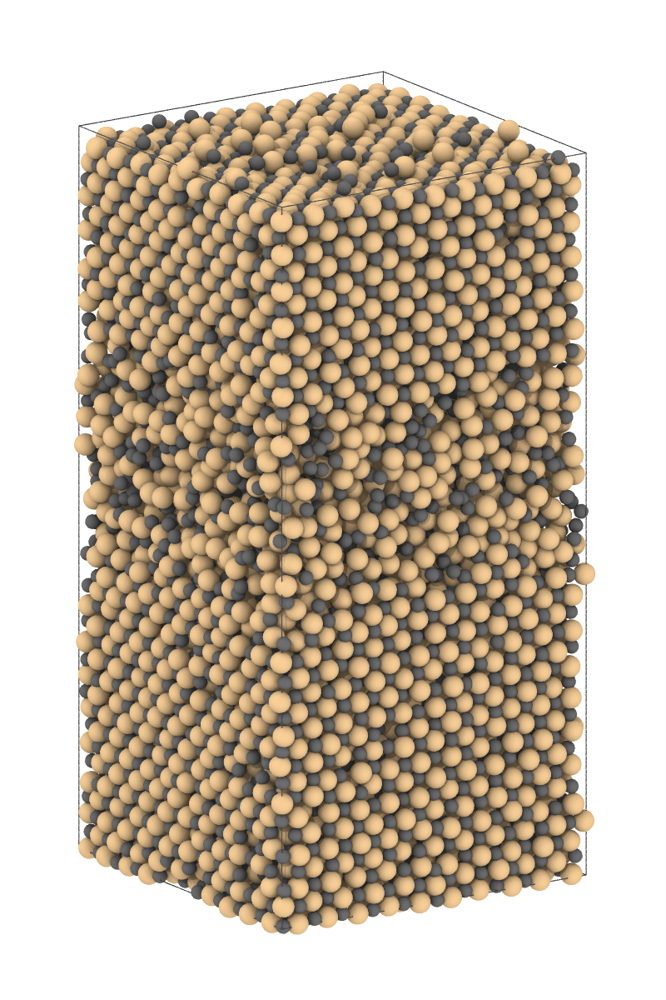

In [15]:
# Change red and blue atoms to Si and C
for P in [90]:
    for trj in ["1equil", "2heathalf", "3coolhalf", "4nph"]:
        print(P, trj)
        T = 4600
        #path = "0116-0122/No_Defect"
        path = "0220-0226/NoDefect_RS"
        framename = f"P{P}_T{T}_{trj}_RS"
        pipeline = import_file(f"{path}/{framename}.xyz")
        pipeline.modifiers.append(ComputePropertyModifier(output_property='Radius', expressions=['(ParticleType==1)*0.78+(ParticleType==2)*1.18']))
        pipeline.modifiers.append(ComputePropertyModifier(output_property='Color', expressions=[
            '(ParticleType==1)*0.4+(ParticleType==2)*0.9',
            '(ParticleType==1)*0.4+(ParticleType==2)*0.75',
            '(ParticleType==1)*0.4+(ParticleType==2)*0.55',
        ]))

        cell_vis = pipeline.source.data.cell.vis
        cell_vis.line_width = 0.05
        cell_vis.rendering_color = (0.3, 0.3, 0.3)

        # Plot
        del ovito.scene.pipelines[:]
        pipeline.add_to_scene()

        vp = Viewport()
        vp.type = Viewport.Type.Front
        #vp.camera_pos = (-10, -15, 15)
        vp.camera_dir = (2, 3, -1)
        #vp.fov = math.radians(60.0)
        vp.zoom_all()

        tachyon = TachyonRenderer(shadows=False, direct_light_intensity=1.1)
        figfile = f"{path}/{framename}.png"
        vp.render_image(filename=figfile, background=(1,1,1), renderer=tachyon, size=(800, 1200), alpha=1.0)

Image(figfile)

## Volume change during decomposition

512k atoms

Text(0.5, 0, 'Simulation time (ps)')

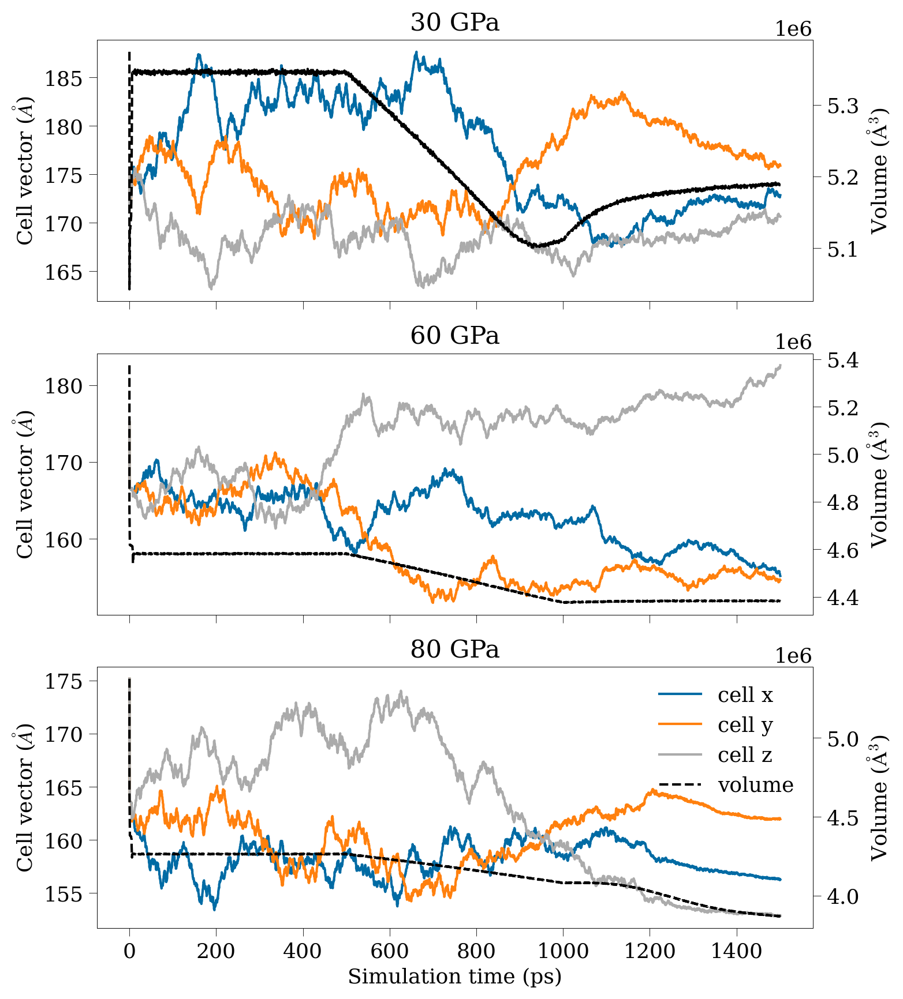

In [26]:
fig, axes = plt.subplots(3, 1, figsize=(8, 10), sharex=True)

for p, P in enumerate([30, 60, 80]):
    cell1 = np.loadtxt(f"0320-0326/Volume/512k_atoms/P{P}_1start_cells.txt")
    cell2 = np.loadtxt(f"0320-0326/Volume/512k_atoms/P{P}_2cooldown_cells.txt")
    cell3 = np.loadtxt(f"0320-0326/Volume/512k_atoms/P{P}_3coolend_cells.txt")
    cell = np.vstack([cell1, cell2, cell3])
    md_time = np.arange(len(cell)) // 2

    ax = axes[p]
    plt.sca(ax)
    plt.plot(md_time, cell[:, 0], label="cell x")
    plt.plot(md_time, cell[:, 4], label="cell y")
    plt.plot(md_time, cell[:, 8], label="cell z")

    handles1, labels1 = plt.gca().get_legend_handles_labels()
    plt.ylabel("Cell vector ($\AA$)")

    ax_twin = ax.twinx()
    plt.sca(ax_twin)
    volumes = cell[:, 0] * cell[:, 4] * cell[:, 8]
    plt.plot(md_time, volumes, "--", color="black", label="volume")

    handles2, labels2 = plt.gca().get_legend_handles_labels()
    plt.ylabel("Volume ($\mathrm{\AA}^3$)")
    plt.title(f"{P} GPa")

plt.sca(axes[-1])
plt.legend(handles1 + handles2, labels1 + labels2)
plt.xlabel("Simulation time (ps)")
# fig.savefig(f"0320-0326/Volume/512k_atoms/cell_volume.pdf", dpi=300, bbox_inches="tight", pad_inches=0.1)

8k atoms

(40, 10, 1001, 2)
(10, 40040, 2)


(0.0, 10.0)

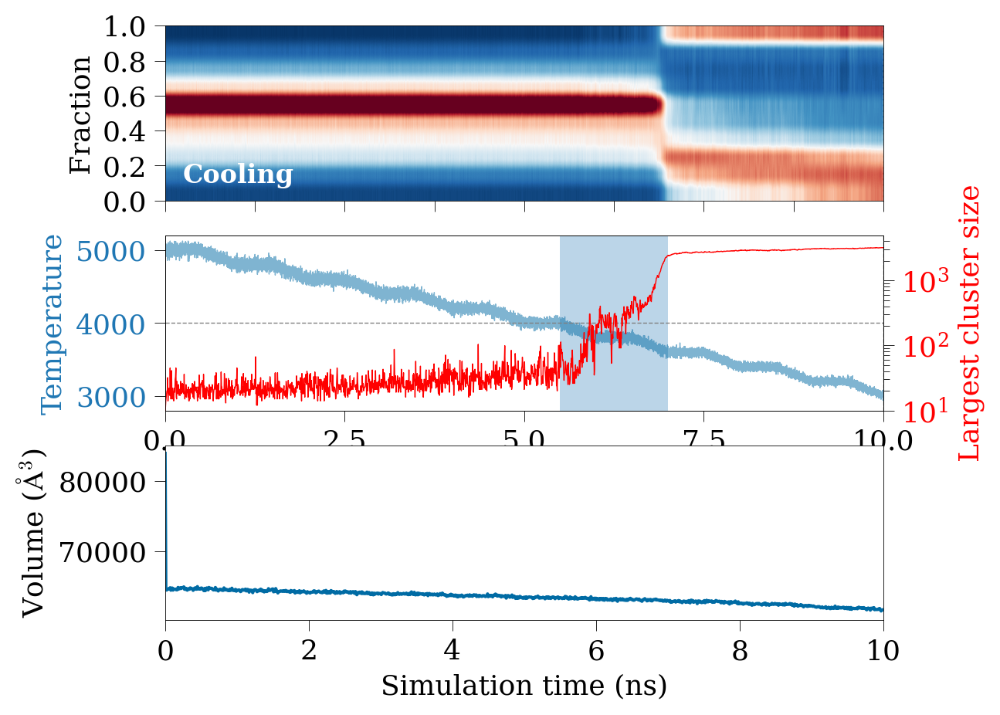

In [29]:
P = 90

fig = plt.figure(figsize=(6, 5))

gs1 = gridspec.GridSpec(3, 1)
ax1 = fig.add_subplot(gs1[0])
ax2 = fig.add_subplot(gs1[1])
ax3 = fig.add_subplot(gs1[2])

axes = [ax1, ax2]
get_slow_md_plot(30)

cell_list = []
for i in range(20):
    curr_cell = np.loadtxt(f"0320-0326/Volume/8k_atoms/P{P}_{i}_cells.txt")
    cell_list.append(curr_cell)
cell = np.vstack(cell_list)

md_time = np.arange(len(cell)) * 10
# plt.plot(md_time, cell[:, 0], label="x")
# plt.plot(md_time, cell[:, 4], label="y")
# plt.plot(md_time, cell[:, 8], label="z")
#plt.vlines([500, 1000], ymin=160, ymax=190, linestyle="--", color="black", linewidth=0.5)
#plt.xlim([0, 1500])
#plt.ylim([160, 190])
# plt.legend()
# plt.ylabel("Cell vector (A)")
# plt.xlabel("Simulation time (ps)")

# plt.figure()
volumes = cell[:, 0] * cell[:, 4] * cell[:, 8]
ax3.plot(md_time / 1000, volumes)
ax3.set_ylabel("Volume ($\mathrm{\AA}^3$)")
ax3.set_xlabel("Simulation time (ns)")
ax1.set_xlim([0, 20000])
ax2.set_xlim([0, 20000])
ax3.set_xlim([0, 10])
#plt.vlines([500, 1000], ymin=5.0e6, ymax=5.4e6, linestyle="--", color="black", linewidth=0.5)
#plt.xlim([0, 1500])
#plt.ylim([6e4, 6.5e4])


# Nucleation analysis

- If use ase version 3.23.0, we need to change the type of atomic number "Z" from "S" to "I" in `xyz` file
```bash
sed -i 's/Properties=id:I:1:Z:S:1:pos:R:3:cluster:I:1/Properties=id:I:1:Z:I:1:pos:R:3:cluster:I:1/g' P60_full_cluster_18_max_overlap.xyz
```

max 1.0
min 0.0004926108374384236


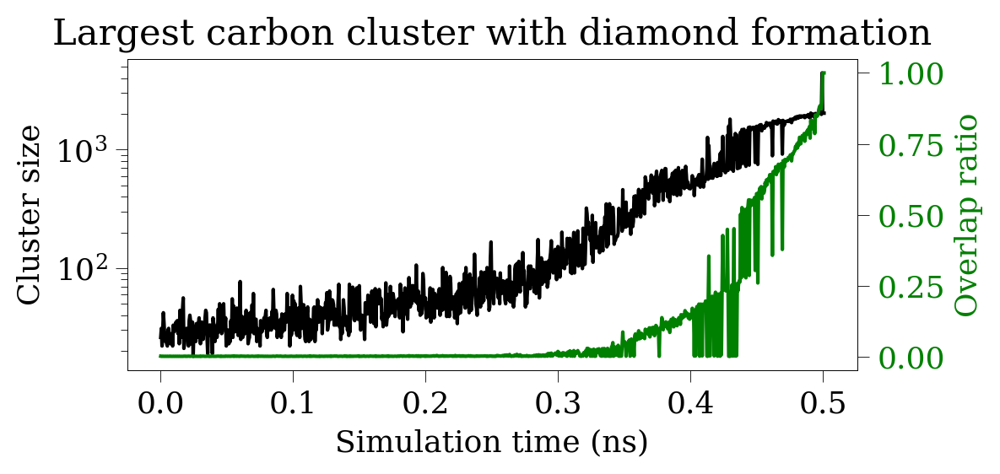

In [102]:
from ase.io import read

overlap_file = "0327-0402/Nucleation/P60_full_maxoverlap.txt"
overlap = np.loadtxt(overlap_file)
# overlap = np.loadtxt("0327-0402/Nucleation/P30_full_maxoverlap.txt")
print("max", np.max(overlap, axis=0))
print("min", np.min(overlap, axis=0))

traj = read("0327-0402/Nucleation/P60_full_cluster_18_max_overlap.xyz", index=":")

sizes = []
for frame in traj:
    sizes.append(len(frame))

fig, ax1 = plt.subplots(figsize=(6, 3))

t = np.arange(overlap.shape[0]) / 2 / 1000  # Timestep: 0.5fs, convert to 1000ps

c1 = "black"
ax1.plot(t, sizes, color=c1, label="Cluster size")
ax1.set_yscale("log")
ax1.set_ylabel("Cluster size", color=c1)
ax1.tick_params(axis='y', labelcolor=c1)

ax2 = ax1.twinx()
c2 = "green"
ax2.plot(t, overlap, color=c2, label="Overlap ratio")
ax2.set_ylabel("Overlap ratio", color=c2)
ax2.tick_params(axis='y', labelcolor=c2)

ax1.set_xlabel("Simulation time (ns)")
phase = "diamond" if "P60" in overlap_file else "graphite"
ax1.set_title(f"Largest carbon cluster with {phase} formation")

fig.tight_layout()

## Cluster size analysis
- Compare cluster size at different stages in the cooling process

1.6876747007014399 1.6876747007014399
2.8497640039184255 2.8497640039184255
1.229270948960144 5.361481109156404


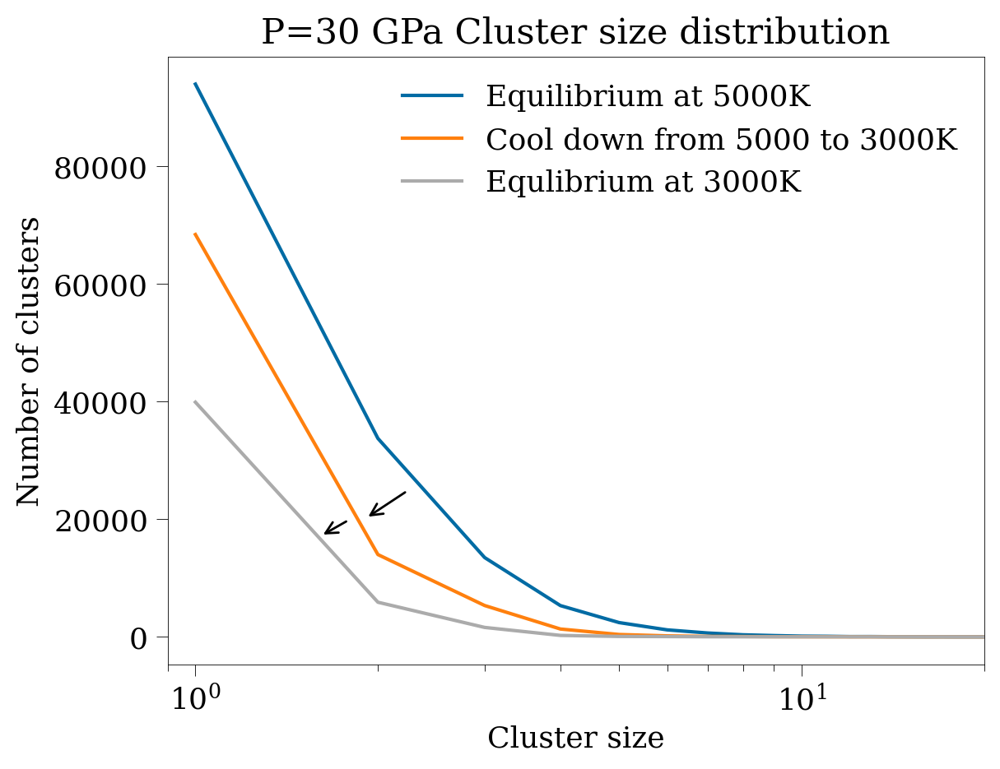

In [103]:
labels = ["Equilibrium at 5000K", "Cool down from 5000 to 3000K", "Equlibrium at 3000K"]
for i in [1, 2, 3]:
    data = np.loadtxt(f"0123-0129/512k_atoms_cool/P30/{i}_cluster_sizes.txt")
    plt.plot(data[:, 0], data[:, 1], label=labels[i-1])

    # average cluster size
    cluster_list = np.loadtxt(f"0123-0129/512k_atoms_cool/P30/{i}_cluster_list.txt")
    print(np.sum(data[:, 0] * data[:, 1]) / np.sum(data[:, 1]), np.mean(cluster_list[:, 1]))

# draw arrows to point from first to second
plt.annotate("", xy=(2.25, 25000), xytext=(1.9, 20000), arrowprops=dict(arrowstyle="<-"))
plt.annotate("", xy=(1.8, 20000), xytext=(1.6, 17000), arrowprops=dict(arrowstyle="<-"))
plt.xscale("log")
#plt.yscale("log")
plt.xlim([0.9, 20])
plt.xlabel("Cluster size")
plt.ylabel("Number of clusters")
plt.title("P=30 GPa Cluster size distribution")
plt.legend()

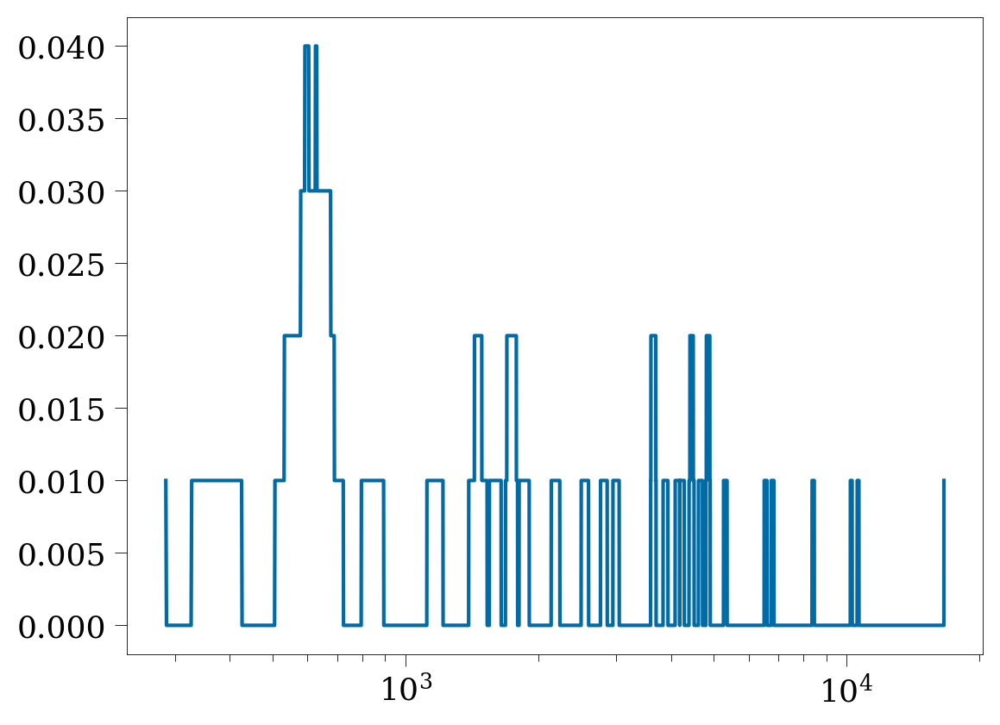

In [104]:
labels = ["Equilibrium at 5000K", "Cool down from 5000 to 3000K", "Equlibrium at 3000K"]
for i in [2]:
    data = np.loadtxt(f"0123-0129/512k_atoms_cool/P30/{i}_cluster_list.txt")

    # sizes = data[30:200000, 0]
    # population = data[30:200000, 1]
    # #plt.plot(sizes, population, label=labels[i-1])

    population, size_edges = np.histogram(data[data[:,1]>30, 1], bins=int(np.max(data[data[:,1]>30, 1])))
    sizes = (size_edges[1:] + size_edges[:-1]) / 2
    #plt.plot(sizes, population, label=labels[i-1] + " (smoothed)")

    N = 100
    smooth_sizes = np.convolve(sizes, np.ones(N)/N, mode='valid')
    smooth_population = np.convolve(population, np.ones(N)/N, mode='valid')
    plt.plot(smooth_sizes, smooth_population, label=labels[i-1] + " (smoothed)")

    # # average cluster size
    # cluster_list = np.loadtxt(f"0123-0129/512k_atoms_cool/P30/{i}_cluster_list.txt")
    # print(np.sum(data[:, 0] * data[:, 1]) / np.sum(data[:, 1]), np.mean(cluster_list[:, 1]))

# # draw arrows to point from first to second
# plt.annotate("", xy=(2.25, 25000), xytext=(1.9, 20000), arrowprops=dict(arrowstyle="<-"))
# plt.annotate("", xy=(1.8, 20000), xytext=(1.6, 17000), arrowprops=dict(arrowstyle="<-"))
plt.xscale("log")
#plt.yscale("log")
# plt.xlim([0.9, 20])
# plt.xlabel("Cluster size")
# plt.ylabel("Number of clusters")
# plt.title("P=30 GPa Cluster size distribution")
# plt.legend()

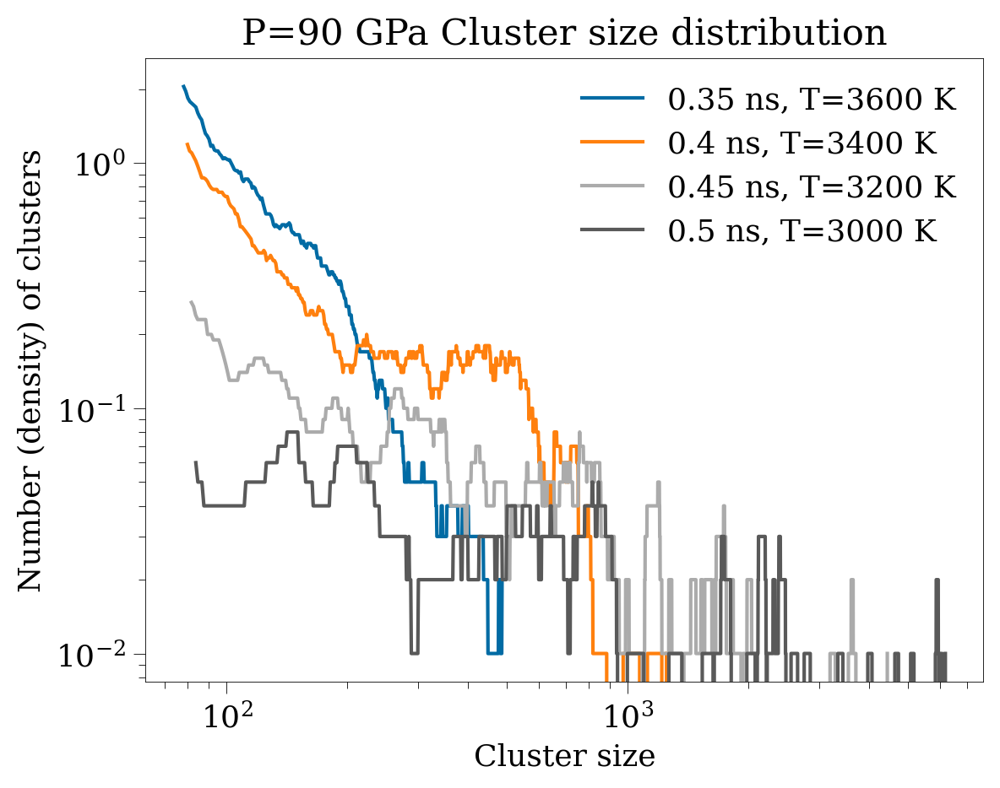

In [105]:
labels = ["Equilibrium at 5000K", "Cool down from 5000 to 3000K", "Equlibrium at 3000K"]
for i in [70, 80, 90, 100]: #, 100]:
    data = np.loadtxt(f"0417-0423/P60_coarse_cluster_sizes_{i}.txt")

    # sizes = data[30:200000, 0]
    # population = data[30:200000, 1]
    # #plt.plot(sizes, population, label=labels[i-1])

    population, size_edges = np.histogram(data[data[:,1]>30, 1], bins=int(np.max(data[data[:,1]>30, 1])))
    #population, size_edges = np.histogram(data[:, 1], bins=int(np.max(data[:, 1])))
    sizes = (size_edges[1:] + size_edges[:-1]) / 2
    #plt.plot(sizes, population, label=labels[i-1] + " (smoothed)")

    N = 100
    smooth_sizes = np.convolve(sizes, np.ones(N)/N, mode='valid')
    smooth_population = np.convolve(population, np.ones(N)/N, mode='valid')
    plt.plot(smooth_sizes, smooth_population, label=f"{i*5/1000} ns, T={5000 - i*20} K") #, label=labels[i-1] + " (smoothed)")

    # # average cluster size
    # cluster_list = np.loadtxt(f"0123-0129/512k_atoms_cool/P30/{i}_cluster_list.txt")
    # print(np.sum(data[:, 0] * data[:, 1]) / np.sum(data[:, 1]), np.mean(cluster_list[:, 1]))

# # draw arrows to point from first to second
# plt.annotate("", xy=(2.25, 25000), xytext=(1.9, 20000), arrowprops=dict(arrowstyle="<-"))
# plt.annotate("", xy=(1.8, 20000), xytext=(1.6, 17000), arrowprops=dict(arrowstyle="<-"))
plt.xscale("log")
plt.yscale("log")
# plt.xlim([0.9, 20])
plt.xlabel("Cluster size")
plt.ylabel("Number (density) of clusters")
plt.title(f"P={P} GPa Cluster size distribution")
plt.legend()

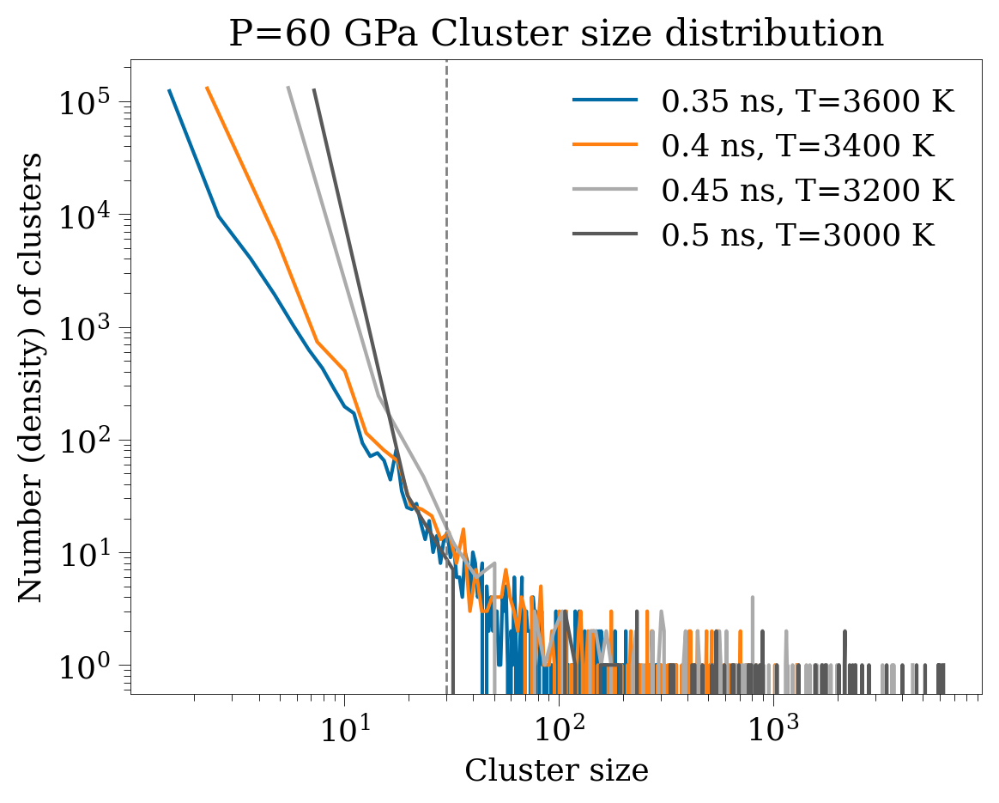

In [106]:
labels = ["Equilibrium at 5000K", "Cool down from 5000 to 3000K", "Equlibrium at 3000K"]
P = 60
for i in [70, 80, 90, 100]: #, 100]:
    data = np.loadtxt(f"0417-0423/P{P}_coarse_cluster_sizes_{i}.txt")

    # sizes = data[30:200000, 0]
    # population = data[30:200000, 1]
    # #plt.plot(sizes, population, label=labels[i-1])

    # population, size_edges = np.histogram(data[data[:,1]<100, 1], bins=int(np.max(data[data[:,1]<100, 1])))
    population, size_edges = np.histogram(data[:, 1], bins=500) #bins=int(np.max(data[:, 1])))
    sizes = (size_edges[1:] + size_edges[:-1]) / 2
    #plt.plot(sizes, population, label=labels[i-1] + " (smoothed)")

    N = 1
    smooth_sizes = np.convolve(sizes, np.ones(N)/N, mode='valid')
    smooth_population = np.convolve(population, np.ones(N)/N, mode='valid')
    plt.plot(smooth_sizes, smooth_population, label=f"{i*5/1000} ns, T={5000 - i*20} K") #, label=labels[i-1] + " (smoothed)")
    #print(smooth_population)

    # # average cluster size
    # cluster_list = np.loadtxt(f"0123-0129/512k_atoms_cool/P30/{i}_cluster_list.txt")
    # print(np.sum(data[:, 0] * data[:, 1]) / np.sum(data[:, 1]), np.mean(cluster_list[:, 1]))

# # draw arrows to point from first to second
# plt.annotate("", xy=(2.25, 25000), xytext=(1.9, 20000), arrowprops=dict(arrowstyle="<-"))
# plt.annotate("", xy=(1.8, 20000), xytext=(1.6, 17000), arrowprops=dict(arrowstyle="<-"))
plt.xscale("log")
plt.yscale("log")
# plt.xlim([0.9, 20])
plt.xlabel("Cluster size")
plt.ylabel("Number (density) of clusters")
plt.axvline(30, color="grey", linestyle="--", linewidth=1)
plt.title(f"P={P} GPa Cluster size distribution")
plt.legend()

/tmp/ipykernel_1035653/458992269.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


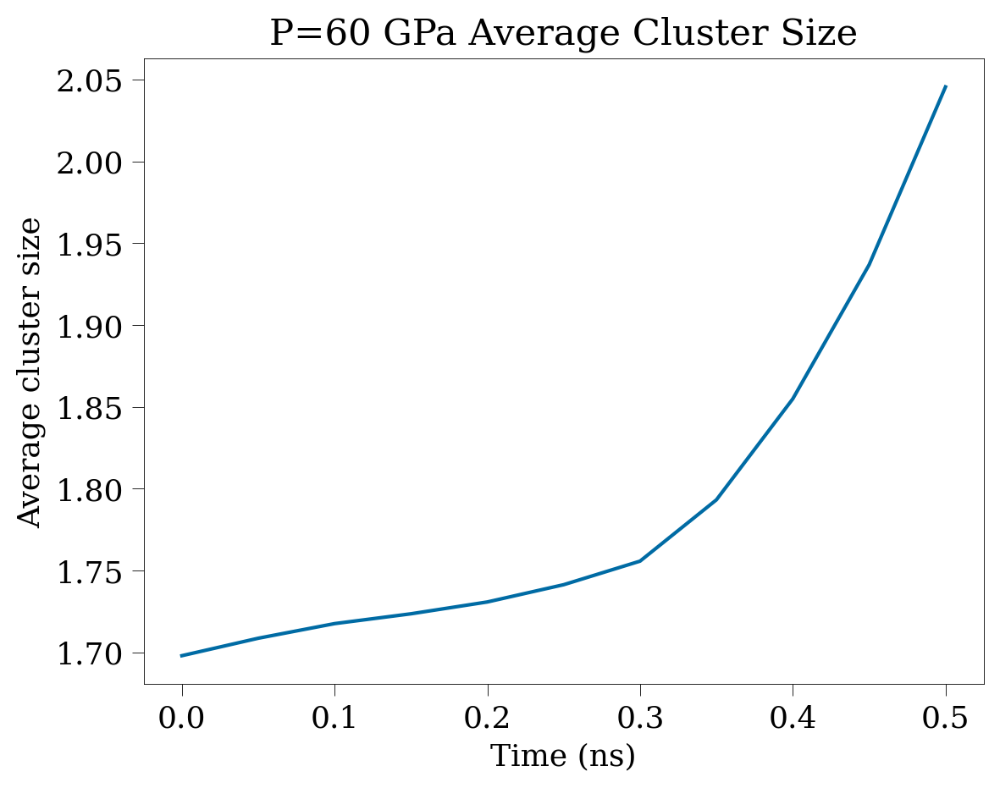

In [107]:
labels = ["Equilibrium at 5000K", "Cool down from 5000 to 3000K", "Equlibrium at 3000K"]
P = 60
average_cluster_size = []
for i in range(0, 101, 10):
    data = np.loadtxt(f"0417-0423/P{P}_coarse_cluster_sizes_{i}.txt")
    average_cluster_size.append(np.mean(data[:, 1]))

plt.plot(np.arange(0, 101, 10) * 5/1000, average_cluster_size) #, label=f"P={P} GPa")
# plt.xscale("log")
# plt.yscale("log")
# plt.xlim([0.9, 20])
plt.xlabel("Time (ns)")
plt.ylabel("Average cluster size")
#plt.axvline(30, color="grey", linestyle="--", linewidth=1)
plt.title(f"P={P} GPa Average Cluster Size")
plt.legend()

### 10M atoms cluster size distribution
- This simulation is not used in the main paper.

803 2091759 481835 1.79238740346223
total number of atoms 5324000.0
1.4993773349937733 2091759.0
6377 2098984 387746 1.9333909767582727
total number of atoms 5324000.0
1.4999215932256547 2098984.0
15534 2075770 328138 2.040954801898195
total number of atoms 5324000.0
1.4999678125402343 2075770.0
15534 2075770 328138 2.040954801898195
total number of atoms 5324000.0
1.4999678125402343 2075770.0
15534 2075770 328138 2.040954801898195
total number of atoms 5324000.0
1.4999678125402343 2075770.0
15534 2075770 328138 2.040954801898195
total number of atoms 5324000.0
1.4999678125402343 2075770.0


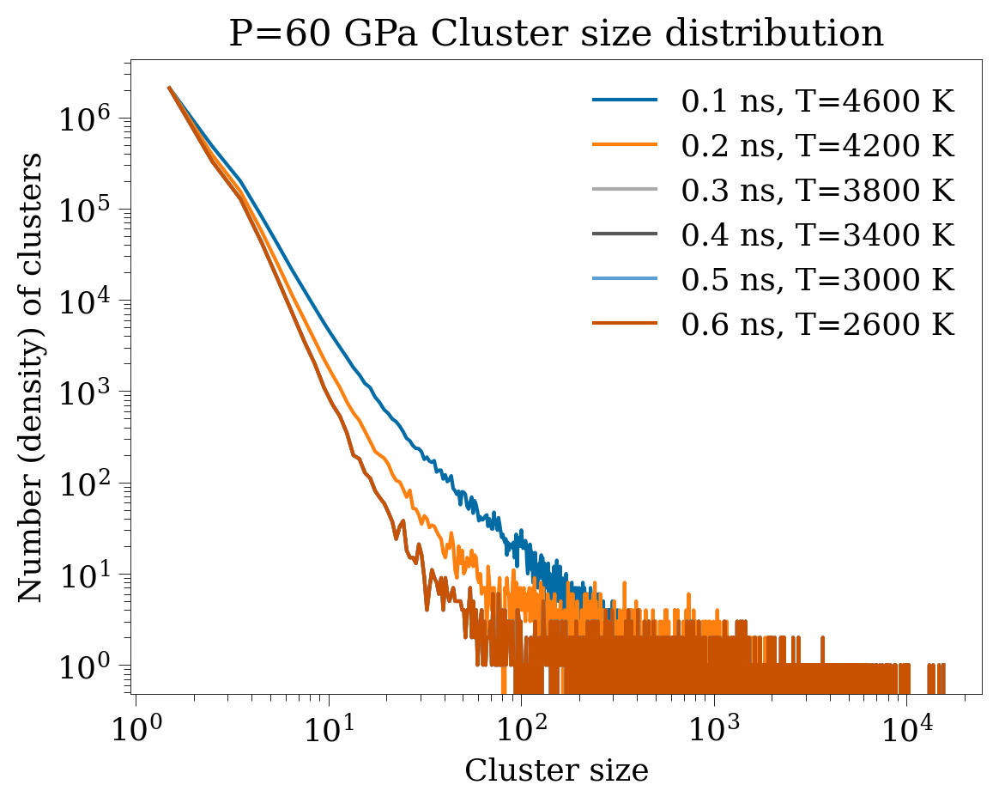

In [108]:
labels = ["Equilibrium at 5000K", "Cool down from 5000 to 3000K", "Equlibrium at 3000K"]
P = 60
for i in range(1, 7):
    data = np.loadtxt(f"0508-0514/P{P}_shorter_cluster_sizes_{i}.txt")

    # sizes = data[30:200000, 0]
    # population = data[30:200000, 1]
    # #plt.plot(sizes, population, label=labels[i-1])

    # population, size_edges = np.histogram(data[data[:,1]<100, 1], bins=int(np.max(data[data[:,1]<100, 1])))
    print(int(np.max(data[data[:,1]>30, 1])), np.sum(data[:, 1] == 1), np.sum(data[:, 1] == 2), np.mean(data[:, 1]))
    # population, size_edges = np.histogram(data[data[:,1]>30, 1], bins=200) #bins=int(np.max(data[data[:,1]>30, 1])))
    population, size_edges = np.histogram(data[:, 1], int(np.max(data[:, 1]))) # 500
    sizes = (size_edges[1:] + size_edges[:-1]) / 2
    #plt.plot(sizes, population, label=labels[i-1] + " (smoothed)")
    print("total number of atoms", np.sum(data[:,1]))

    N = 1
    smooth_sizes = np.convolve(sizes, np.ones(N)/N, mode='valid')
    smooth_population = np.convolve(population, np.ones(N)/N, mode='valid')
    print(smooth_sizes[0], smooth_population[0])
    plt.plot(smooth_sizes, smooth_population, label=f"{i*100/1000} ns, T={5000 - i*400} K") #, label=labels[i-1] + " (smoothed)")
    #print(smooth_population)

    # # average cluster size
    # cluster_list = np.loadtxt(f"0123-0129/512k_atoms_cool/P30/{i}_cluster_list.txt")
    # print(np.sum(data[:, 0] * data[:, 1]) / np.sum(data[:, 1]), np.mean(cluster_list[:, 1]))

# # draw arrows to point from first to second
# plt.annotate("", xy=(2.25, 25000), xytext=(1.9, 20000), arrowprops=dict(arrowstyle="<-"))
# plt.annotate("", xy=(1.8, 20000), xytext=(1.6, 17000), arrowprops=dict(arrowstyle="<-"))
plt.xscale("log")
plt.yscale("log")
# plt.xlim([0.9, 20])
plt.xlabel("Cluster size")
plt.ylabel("Number (density) of clusters")
# plt.axvline(30, color="grey", linestyle="--", linewidth=1)
plt.title(f"P={P} GPa Cluster size distribution")
plt.legend()

## Mean Squared Displacement (MSD) analysis

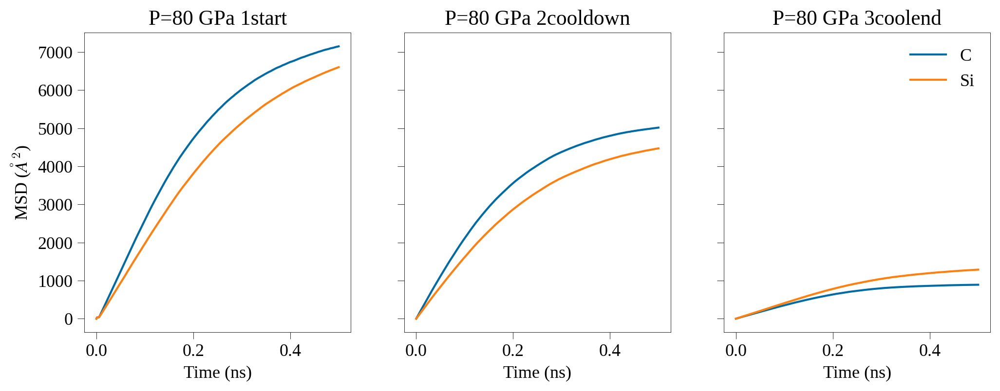

In [12]:
P = 80

fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)
for i, trj in enumerate(["1start", "2cooldown", "3coolend"]):
    plt.sca(axes[i])
    for elem in ["C", "Si"]:
        msd = np.loadtxt(f"0417-0423/MSD/P{P}_{trj}_{elem}_msd.txt")
        t = np.arange(0, len(msd)) * 0.5/1000
        plt.plot(t, msd, label=elem)
    plt.xlabel("Time (ns)")
    if i == 0: plt.ylabel("MSD ($\AA^2$)")
    plt.title(f"P={P} GPa {trj}")
plt.legend()

## Spatial correlation
- Compute autocorrelation function of C-C, Si-Si, and Si-C pairs

In [110]:
import time

def wrap_index(index, size):
    return np.mod(index, size)

def autocorrelation_distance_3d(grid, num_bins, voxel_lengths=(1, 1, 1), pair="C-C"):
    nx, ny, nz = grid.shape
    voxel_lengths = np.asarray(voxel_lengths)
    lattice_lengths = np.array([nx, ny, nz]) * voxel_lengths
    max_distance = min(lattice_lengths) / 2
    bin_width = max_distance / num_bins

    autocorr = np.zeros((num_bins,))
    bin_counts = np.zeros((num_bins,))

    for dx in range(-nx // 2, nx // 2 + 1):
        for dy in range(-ny // 2, ny // 2 + 1):
            for dz in range(-nz // 2, nz // 2 + 1):
                distance = np.sqrt((dx * voxel_lengths[0])**2 + (dy * voxel_lengths[1])**2 + (dz * voxel_lengths[2])**2)
                bin_index = int(distance // bin_width)

                if bin_index < num_bins:
                    wrapped_x = wrap_index(np.arange(nx) + dx, nx)
                    wrapped_y = wrap_index(np.arange(ny) + dy, ny)
                    wrapped_z = wrap_index(np.arange(nz) + dz, nz)

                    if pair == "C-C":
                        product = np.sum(grid * grid[np.ix_(wrapped_x, wrapped_y, wrapped_z)])
                    elif pair == "C-Si":
                        product = np.sum(grid * (1 - grid[np.ix_(wrapped_x, wrapped_y, wrapped_z)]))
                    elif pair == "Si-C":
                        product = np.sum((1 - grid) * grid[np.ix_(wrapped_x, wrapped_y, wrapped_z)])
                    elif pair == "Si-Si":
                        product = np.sum((1 - grid) * (1 - grid[np.ix_(wrapped_x, wrapped_y, wrapped_z)]))
                    autocorr[bin_index] += product
                    bin_counts[bin_index] += nx * ny * nz

    autocorr /= bin_counts

    # Filter out the autocorr values and distances where bin_counts are zero
    valid_indices = np.where(bin_counts != 0)
    autocorr = autocorr[valid_indices]
    distances = np.linspace(bin_width / 2, (num_bins - 0.5) * bin_width, num_bins)[valid_indices]

    return autocorr, distances

for i in range(0, 101, 10):
    tic = time.time()
    filename = f"0515-0521/ConcentrationVoxels/density_{i}.vtk"
    with open(filename) as f:
        for line in f.readlines():
            if "DIMENSIONS" in line:
                dimensions = [int(s) for s in line.split()[1:]]
            if "SPACING" in line:
                voxel_lengths = [float(s) for s in line.split()[1:]]
                break

    grid = np.loadtxt(filename, skiprows=11)
    assert len(grid) == dimensions[0] * dimensions[1]
    grid = np.reshape(grid, dimensions)
    voxel_volume = voxel_lengths[0] * voxel_lengths[1] * voxel_lengths[2]
    grid /= voxel_volume

    num_bins = 40 
    pair = "C-C"
    autocorr_distance, distances = autocorrelation_distance_3d(grid, num_bins, voxel_lengths, pair)
    print("time", time.time() - tic)

    # Plotting the autocorrelation function versus distance
    np.savetxt(f"0515-0521/SpatialCorrelation/{pair}_autocorr_distance_{i}.txt", np.array([distances, autocorr_distance]).T)

/tmp/ipykernel_1035653/2228016144.py:38: RuntimeWarning: invalid value encountered in divide
  autocorr /= bin_counts


time 11.153926134109497
time 10.94417428970337
time 10.674736261367798
time 9.959259271621704
time 9.44989562034607
time 9.68557071685791
time 10.040567398071289
time 10.351907968521118
time 9.989847898483276
time 10.223570346832275
time 10.076676368713379


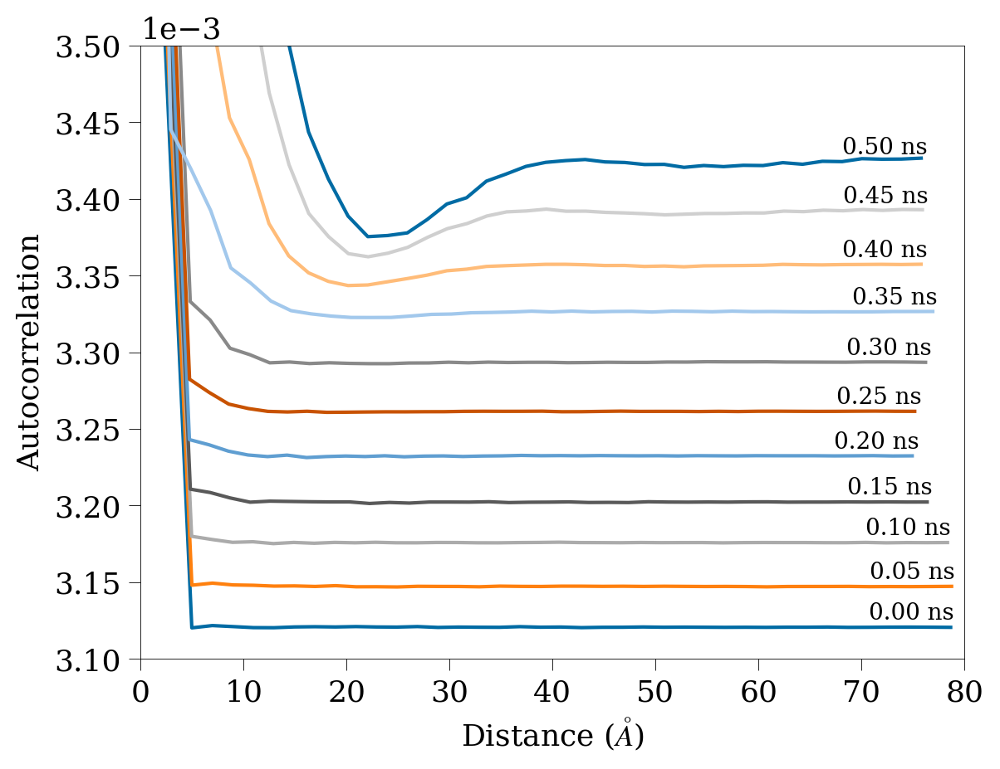

In [ ]:
# fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
for i in range(0, 101, 10):
    distances, autocorr_distance = np.loadtxt(f"0515-0521/SpatialCorrelation/C-C_autocorr_distance_{i}.txt").T
    plt.plot(distances, autocorr_distance) # label=f"{i*0.005:.2f} ns")
    plt.annotate(
        f"{i*0.005:.2f} ns", 
        (distances[-5], autocorr_distance[-5]), 
        xytext=(distances[-5], autocorr_distance[-5] + 5e-6), 
        fontsize=10,
    )

plt.xlabel('Distance ($\AA$)')
plt.ylabel('Autocorrelation')
# plt.title('Spatial Autocorrelation Function')
# plt.grid(True)
# plt.ylim([0.219, 0.227])
plt.ylim([0.00310, 0.00350])
plt.xlim([0, 80])
plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
# plt.legend(loc='lower left', bbox_to_anchor=(1, 0.1))
# plt.savefig("0515-0521/SpatialCorrelation/C-C_autocorr_distance.pdf", bbox_inches='tight')